# Load libraries

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle

# Read data

In [2]:
%matplotlib inline
##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
version = 'V6.6.flareAb.h5ad'
adata = sc.read(version, cache=True)
print(adata)
figdir = "./figures."
sc.settings.figdir = "./figures."
MASTERCOLORS = sc.pl.palettes.default_64
MASTERCOLORS.remove("#FEFFE6")
MASTERCOLORS.remove("#FFFF00")

Only considering the two last: ['.flareAb', '.h5ad'].
Only considering the two last: ['.flareAb', '.h5ad'].
AnnData object with n_obs × n_vars = 153955 × 1164 
    obs: 'SOURCE', 'batch_cov', 'ind_cov', 'well', 'Female', 'pop_cov', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC3', 'PC16', 'steroid', 'plaquenil', 'cellcept', 'cyclophosphamide', 'rituxumab', 'louvain', 'leiden'
    uns: 'barcodes', 'diffmap_evals', 'genes', 'leiden'

# Sort adata in a consistent way

In [3]:
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("IMMVAR")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("IMMVAR")] = "UCSF"
adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1), ordered=True)
# Sorting proportions by healthy versus treated versus untreated.
adata.obs['ind_cov_disease_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['disease_cov'], axis=1), ordered=True)
adata.obs.to_csv('adata.obs.txt')

## Create useful function

In [4]:
def marker_gene_expression(anndata, marker_dict, gene_symbol_key=None, partition_key='louvain_r1'):
   """A function go get mean z-score expressions of marker genes
   #
   # Inputs:
   #    anndata         - An AnnData object containing the data set and a partition
   #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or
   #                      an anndata.var field with the key given by the gene_symbol_key input
   #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker
   #                      genes
   #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
   #                      'louvain_r1' """

   # Test inputs
   if partition_key not in anndata.obs.columns.values:
       print('KeyError: The partition key was not found in the passed AnnData object.')
       print('   Have you done the clustering? If so, please pass the cluster IDs with the AnnData object!')
       raise

   if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
       print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
       print('   Check that your cell type markers are given in a format that your anndata object knows!')
       raise

   if gene_symbol_key:
       gene_ids = anndata.var[gene_symbol_key]
   else:
       gene_ids = anndata.var_names

   clusters = anndata.obs[partition_key].cat.categories
   n_clust = len(clusters)
   marker_exp = pd.DataFrame(columns=clusters)
   marker_exp['cell_type'] = pd.Series({}, dtype='str')
   marker_names = []

   z_scores = sc.pp.scale(anndata, copy=True)

   i = 0
   for group in marker_dict:
       # Find the corresponding columns and get their mean expression in the cluster
       for gene in marker_dict[group]:
           ens_idx = np.in1d(gene_ids, gene) #Note there may be multiple mappings
           if np.sum(ens_idx) == 0:
               continue
           else:
               z_scores.obs[ens_idx[0]] = z_scores.X[:,ens_idx].mean(1) #works for both single and multiple mapping
               ens_idx = ens_idx[0]

           clust_marker_exp = z_scores.obs.groupby(partition_key)[ens_idx].apply(np.mean).tolist()
           clust_marker_exp.append(group)
           marker_exp.loc[i] = clust_marker_exp
           marker_names.append(gene)
           i+=1

   # Replace the rownames with informative gene symbols
   marker_exp.index = marker_names

   return(marker_exp)

marker_dictionary = pd.DataFrame({"all": adata.var_names})

# Figure 6A: Projection and dropprint

In [5]:
sc.pl.umap(adata, size=3, color="disease_pop_site_cov", edgecolor="none", save='.disease_pop.png', palette=sc.pl.palettes.vega_20_scanpy)

saving figure to file ./figures./umap.disease_pop.png


In [6]:
disease_umap = sc.pl.umap(adata, color='disease_cov', size=3, show=False, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.disease.png')

saving figure to file ./figures./umap.disease.png


computing density on 'umap'
saving figure to file ./figures./umap_density_disease_cov_umap_density_disease_cov.png


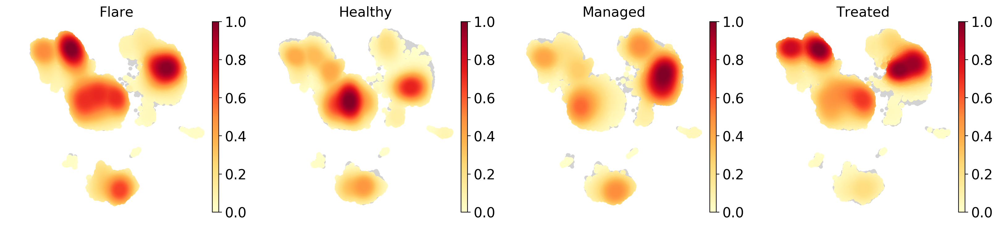

In [7]:
sc.tl.embedding_density(adata, basis='umap', groupby='disease_cov')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_disease_cov', show=True,  save='umap_density_disease_cov.png')

saving figure to file ./figures./umap.batch.png


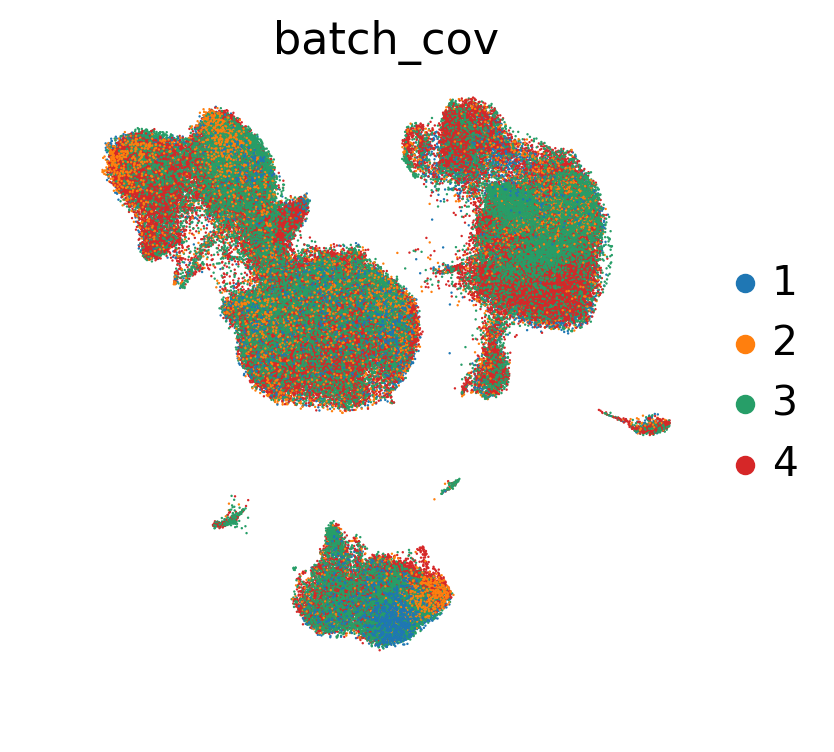

In [8]:
disease_umap = sc.pl.umap(adata, color='batch_cov', size=3,show=True, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.batch.png')

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

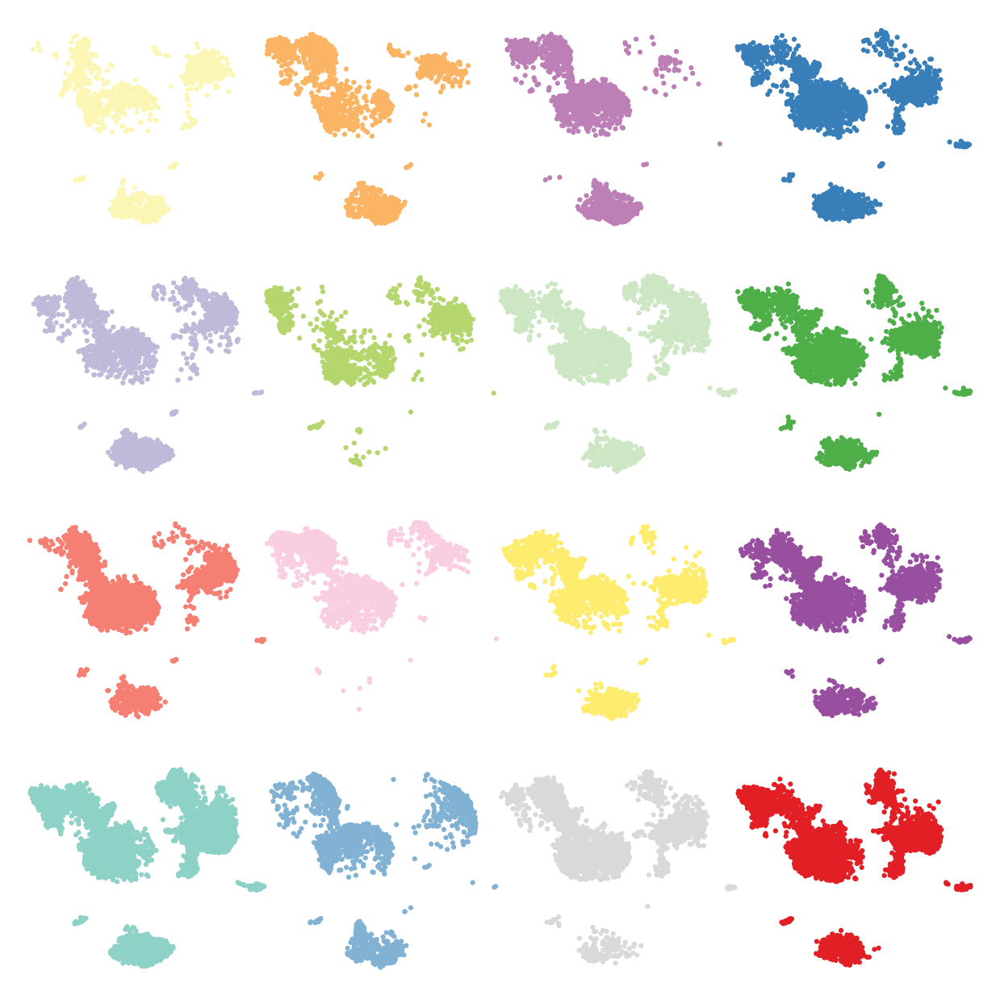

In [9]:
# Plot 16 plots for the individuals.
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F", "#8ED1C6","#FCF6B5", "#BEBAD9"];
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = adata.obs.batch_cov.unique()[0]
batch = adata.obs.ind_cov_disease_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(16)):
    ind = batch[ind_i]
    col = colors[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov_disease_cov==ind,], color = "ind_cov_disease_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/'+batch_name+'.ind.png')

# Rank genes and plot leiden groups

ranking genes
    finished (0:03:40.16)


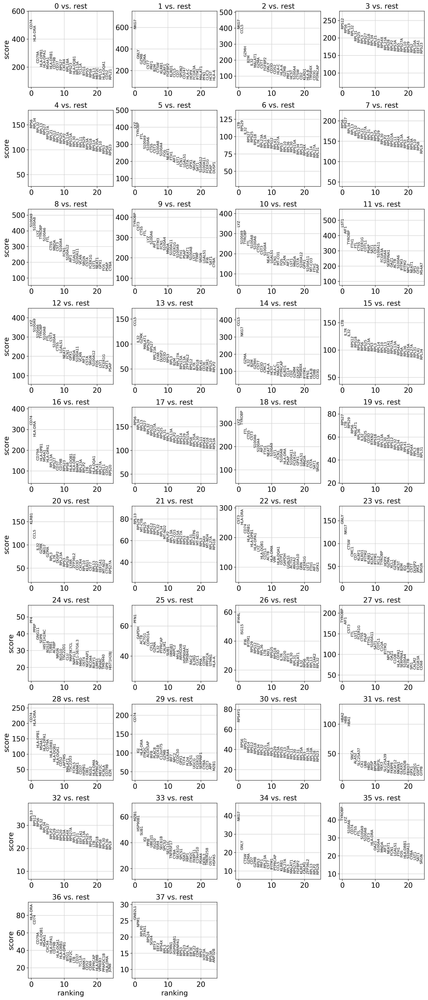

In [10]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

saving figure to file ./figures./umap.leiden.png


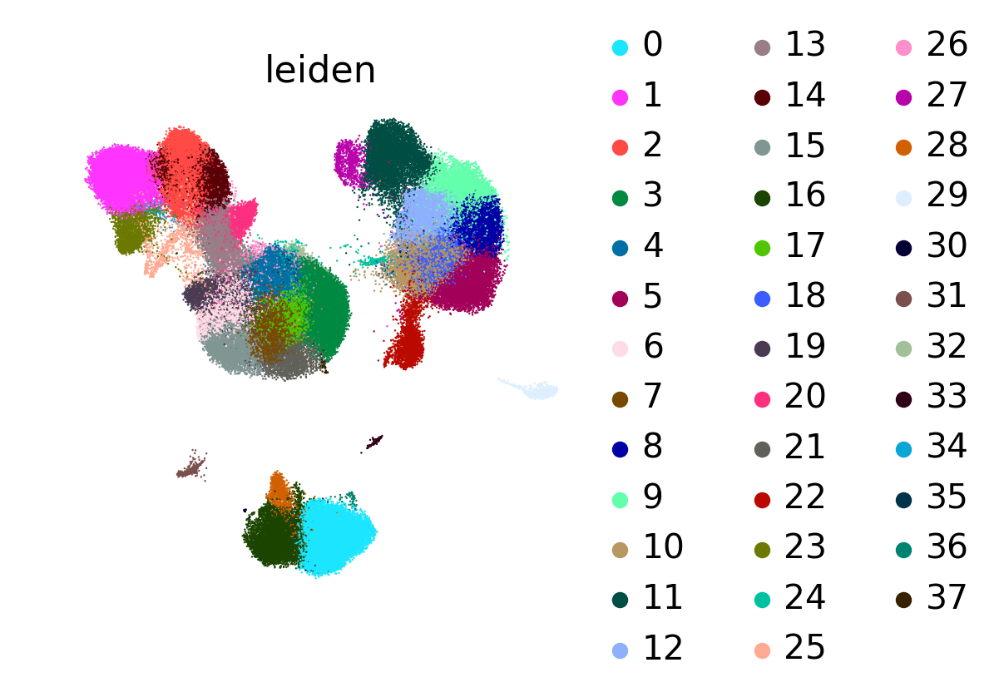

In [11]:
sc.pl.umap(adata, color='leiden', size=3, show=True, edgecolor="none", save='.leiden.png', palette=MASTERCOLORS)

# Most expressed genes per leiden group

In [12]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.to_csv('FLARE_top_expression.csv')
GeneRanks.head(10)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22,leiden_23,leiden_24,leiden_25,leiden_26,leiden_27,leiden_28,leiden_29,leiden_30,leiden_31,leiden_32,leiden_33,leiden_34,leiden_35,leiden_36,leiden_37
0,TCL1A,KLRF1,GZMH,RP11-291B21.2,CCR7,IL8,IL7R,ADTRP,S100A12,IFITM3,S100A12,CDKN1C,IL1R2,GZMK,CCL5,IL7R,RP5-887A10.1,CCR7,LGALS2,RTKN2,KLRB1,IL7R,FCER1A,XCL1,ACRBP,KIAA0101,IFIT3,C1QB,FCRL5,LILRA4,EIF1AY,HBA1,C1QB,MZB1,GNLY,MS4A1,TCL1A,PRSS57
1,CD79A,GZMB,FGFBP2,CD8B,IL7R,IL1B,ITGB1,TSHZ2,MNDA,APOBEC3A,VCAN,FCGR3A,CD163,CCL5,CMC1,TNFRSF4,MS4A1,IL7R,CST3,RP11-1399P15.1,GZMK,PRKCQ-AS1,CLEC10A,XCL2,PF4,MKI67,IFI44L,C1QA,PPP1R14A,SERPINF1,RPS4Y1,ALAS2,C1QA,TNFRSF17,NKG7,TCL1A,VPREB3,LAPTM4B
2,MS4A1,PRF1,CCL5,CCR7,FHIT,G0S2,IL32,FHIT,VCAN,MNDA,CSTA,MS4A7,RETN,LYAR,GZMH,AQP3,BANK1,LEF1,MS4A6A,TIGIT,SLC4A10,MAL,CD1C,KLRC1,RP11-367G6.3,TYMS,IFIT1,C1QC,MS4A1,TPM2,DDX3Y,SNCA,C1QC,IGJ,KLRF1,LINC00926,FCRL1,MYB
3,CD79B,SPON2,NKG7,CD8A,LEF1,S100A12,CD40LG,PRKCQ-AS1,FCN1,LGALS2,MNDA,HES4,S100A12,DUSP2,NKG7,IL32,CD79A,CD27,FCN1,IL2RA,DUSP2,LEF1,HLA-DQA1,SPTSSB,GNG11,STMN1,MX1,FCGR3A,MPP6,PLD4,CCR7,CA1,IL7R,DERL3,PRF1,CD79A,CD72,SPINK2
4,VPREB3,GNLY,CST7,S100B,PRKCQ-AS1,CSTA,CRIP1,FAM13A,CSTA,FCN1,CD14,RP11-290F20.3,VCAN,IL32,GZMA,RP11-403A21.2,TNFRSF13B,PRKCQ-AS1,AIF1,ICA1,KLRG1,CCR7,HLA-DQB1,KLRF1,HIST1H2BJ,TK1,ISG15,MS4A7,CD79A,SCT,MAL,HBA2,CCR7,ITM2C,GZMA,MEF2C,PAX5,SOX4
5,LINC00926,CLIC3,GZMA,LEF1,CD27,NAMPT,GATA3,TRAT1,CD14,FGL2,CD36,LST1,SAP30,FXYD2,CST7,TRAT1,RALGPS2,MAL,CPVL,IKZF2,LYAR,TRAT1,HLA-DPB1,CMC1,TSC22D1,CENPF,HERC5,HES4,CD19,IL3RA,IL7R,HBD,PRKCQ-AS1,AL928768.3,GZMB,PAX5,FCRLA,PTPLA
6,FCER2,NKG7,ZNF683,IL7R,MAL,FOS,TNFRSF4,MAL,RBP7,TYMP,FCN1,RHOC,RNASE2,PIK3R1,CCL4,KLRB1,AL928768.3,FHIT,CSTA,ARID5B,NCR3,TSHZ2,HLA-DPA1,GNLY,SDPR,BIRC5,IFI6,LYPD2,FCRLA,CLEC4C,PRKCQ-AS1,AHSP,LEF1,HRASLS2,CTSW,CD79B,HLA-DOB,EGFL7
7,HLA-DRA,FGFBP2,GNLY,NUCB2,NUCB2,VCAN,AQP3,CCR7,CST3,IFI6,GPX1,LYPD2,MNDA,CD8B,CD8A,CD40LG,BLK,CD3G,CTSS,CD27,IL7R,CD27,CPVL,IL2RB,RGS18,RRM2,SAMD9L,RP11-290F20.3,FCRL2,ITM2C,FHIT,HBB,ADTRP,TNFRSF13B,CD7,S100A12,MACROD2,WBP5
8,BANK1,CST7,GZMB,CD27,BCL11B,CD14,LMNA,IL7R,CTSS,CD14,MS4A6A,SERPINA1,CSTA,IL7R,KLRD1,RORA,CD79B,BCL11B,FGL2,MAL,CCL5,CD3G,LMNA,CTSW,MAP3K7CL,NUSAP1,XAF1,CDKN1C,HLA-DQA1,LRRC26,LEF1,BPGM,CD27,IGLL5,CST7,BANK1,MS4A1,HEMGN
9,HLA-DQB1,GZMA,IL32,PRKCQ-AS1,AC013264.2,LGALS2,RP11-403A21.2,LEF1,MS4A6A,TNFSF13B,CTSS,AIF1,CLEC4E,CD8A,CD8B,CCR6,AC079767.4,NUCB2,TYROBP,BIRC3,GZMA,BCL11B,HLA-DMA,KLRD1,C2orf88,TOP2A,EPSTI1,LILRA3,FCRL3,PTCRA,CD27,SLC25A37,FHIT,CD38,SPON2,ADAM28,BLNK,ANKRD28


## Do some manual cell type assignment

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


saving figure to file ./figures./umap.figure6a.png


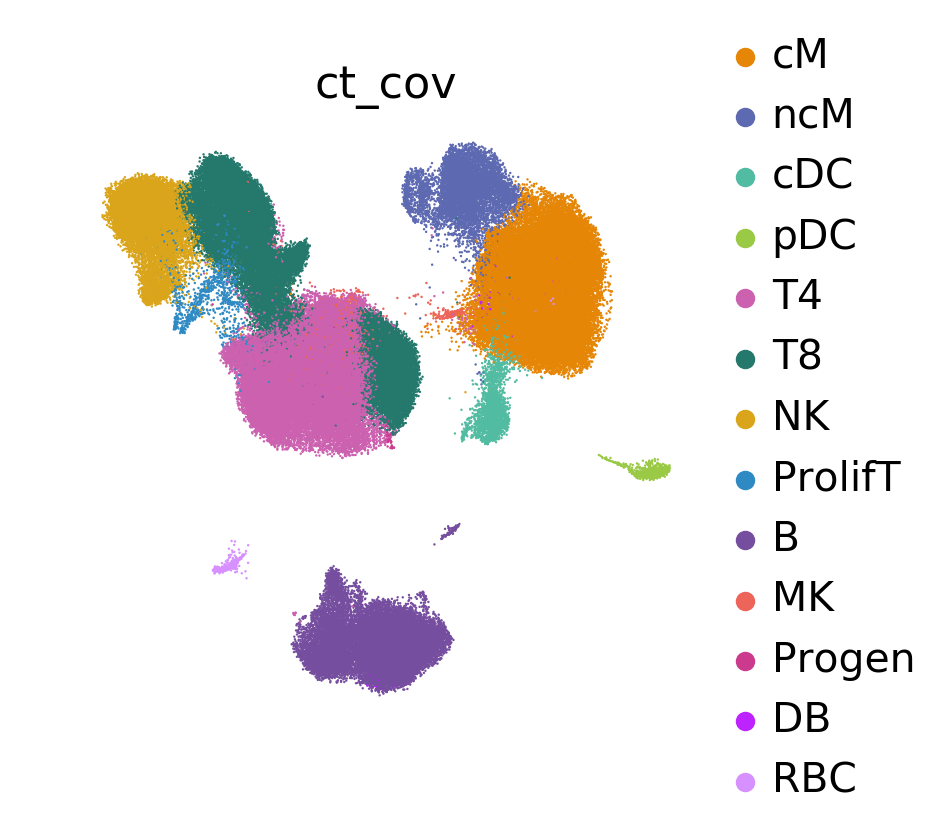

In [13]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype("str")
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "B" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "NK" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "T8" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "T8" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "ncM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "T8" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T8" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "T4" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "B" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "T4" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "cM" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "T4" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "T8" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "NK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "MK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "ProlifT" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "ncM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "pDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "RBC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "T4" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "NK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "DB" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB', 'RBC']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none" ,save='.figure6a.png')


# 11 populations figure6a and figure6b

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-18.62656757973228,cM,9.664540109354923e-06
1,-6.586696067349559,ncM,7.573557576435642e-05
2,-0.320820187702821,cDC,0.2735984464716545
3,-0.010939070132127332,pDC,0.9522461270326624
4,16.423636900984462,T4,0.0003190454466282978
5,8.497071550450007,T8,0.013443278314248934
6,-0.5121495100074057,NK,0.7630724562403985
7,-0.03578709829755106,ProlifT,0.5732874773137395
8,0.5025845421458595,B,0.8305424755865423
9,0.6146578448617228,MK,0.011250498193877457


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-9.598891503989949,cM,0.049610
1,-1.1849895096959806,ncM,0.224185
2,1.2372643047349567,cDC,0.000228
3,0.5992260109225527,pDC,0.002017
4,16.763109828181555,T4,0.000097
5,-9.83014710427977,T8,0.042979
6,-5.516165065046158,NK,0.027340
7,-0.49221233135825415,ProlifT,0.009854
8,7.121117802753171,B,0.003512
9,0.45948492530960466,MK,0.051472


as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-4.667404793720584,cM,0.246280
1,0.6426377163219268,ncM,0.342168
2,1.1417364792763791,cDC,0.000015
3,0.5307433234087293,pDC,0.000114
4,11.439906892538476,T4,0.000257
5,-8.14156110998216,T8,0.006480
6,0.3500528553160128,NK,0.807461
7,-0.8590509853667752,ProlifT,0.009771
8,-1.0309262098735772,B,0.717781
9,0.5042368410789463,MK,0.002026


as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,4.931486710269353,cM,0.527289
1,1.8276272260179045,ncM,0.094260
2,-0.09552782545857677,cDC,0.721814
3,-0.06848268751382328,pDC,0.394092
4,-5.323202935643076,T4,0.096360
5,1.6885859942975996,T8,0.733651
6,5.866217920362162,NK,0.058939
7,-0.366838654008521,ProlifT,0.506090
8,-8.152044012626751,B,0.091735
9,0.04475191576934177,MK,0.772060


as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-9.027676075742338,cM,0.325104
1,-5.40170655765358,ncM,0.034201
2,-1.558084492437777,cDC,0.000160
3,-0.6101650810546801,pDC,0.000207
4,-0.3394729271970993,T4,0.915261
5,18.327218654729773,T8,0.011543
6,5.004015555038748,NK,0.253469
7,0.45642523306070276,ProlifT,0.155507
8,-6.618533260607315,B,0.052380
9,0.15517291955211826,MK,0.431842


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-14.396319273780113,cM,0.000950
1,-4.055528597111565,ncM,0.002461
2,0.39537242768224545,cDC,0.178722
3,0.2749761287326575,pDC,0.072735
4,16.582709375798974,T4,0.000001
5,-0.09081806992615071,T8,0.981815
6,-2.8569642936858717,NK,0.154627
7,-0.24966185994711548,ProlifT,0.080451
8,3.4273256934333505,B,0.090567
9,0.5419458894750178,MK,0.002809


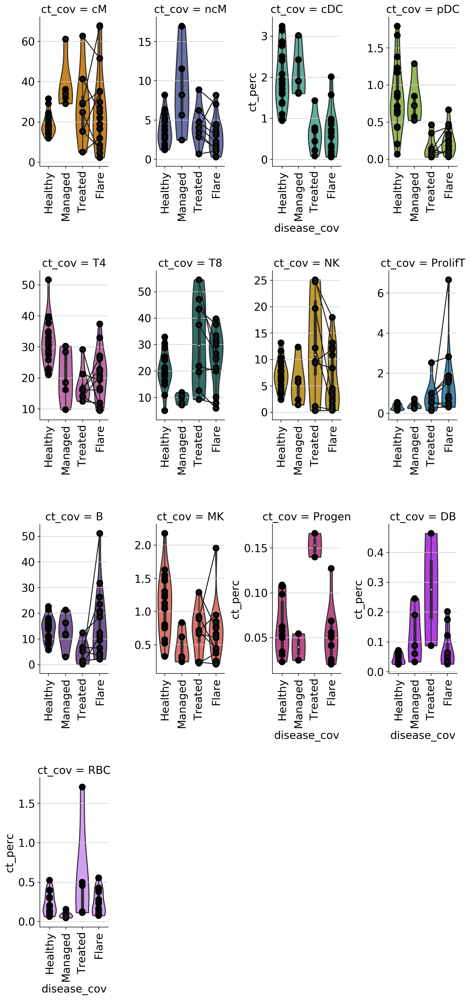

In [16]:
# Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]

# filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['pDC', 'iM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em cyto3', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progen',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', order=[ "Healthy", "Managed", "Treated", "Flare"], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.png")
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.pdf")


# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Managed'])]
HEALTHYMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated'])]
HEALTHYTREATED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Treated"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYTREATED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)


# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Flare'])]
HEALTHYFLARE_effect = {}
HEALTHYFLARE_FC = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYFLARE_effect[ct] = effect
    HEALTHYFLARE_FC[ct] = math.log2(sum(est.params)/est.params[0])
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Flare'])]
TREATEDFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Managed'])]
TREATEDMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

In [17]:
def getproportions(celltype, group1, group2):
    print('{} proportion for celltype: {}: {}' .format(group1, celltype, ind_perc[ind_perc.disease_cov==group1][ind_perc.ct_cov==celltype].ct_perc.mean()))
    print('{} proportion for celltype: {}: {}' .format(group2, celltype, ind_perc[ind_perc.disease_cov==group2][ind_perc.ct_cov==celltype].ct_perc.mean()))

    
getproportions(celltype='T4',group1='Healthy', group2='Flare')

Healthy proportion for celltype: T4: 31.67240400131884
Flare proportion for celltype: T4: 20.7958793513645


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


# Effect size scatter plot

,UNT/HEALTHY,Cross_TR/HEALTHY,Cell Type
cM,4.667405,10.741421,cM
ncM,0.642638,1.674219,ncM
cDC,1.141736,0.131258,cDC
pDC,0.530743,0.545722,pDC
T4,11.439907,13.335546,T4
T8,8.141561,1.325141,T8
NK,0.350053,0.301403,NK
ProlifT,0.859051,0.336243,ProlifT
B,1.030926,0.187298,B
MK,0.504237,0.169634,MK


                  UNT/HEALTHY  Cross_TR/HEALTHY
UNT/HEALTHY          1.000000          0.772881
Cross_TR/HEALTHY     0.772881          1.000000


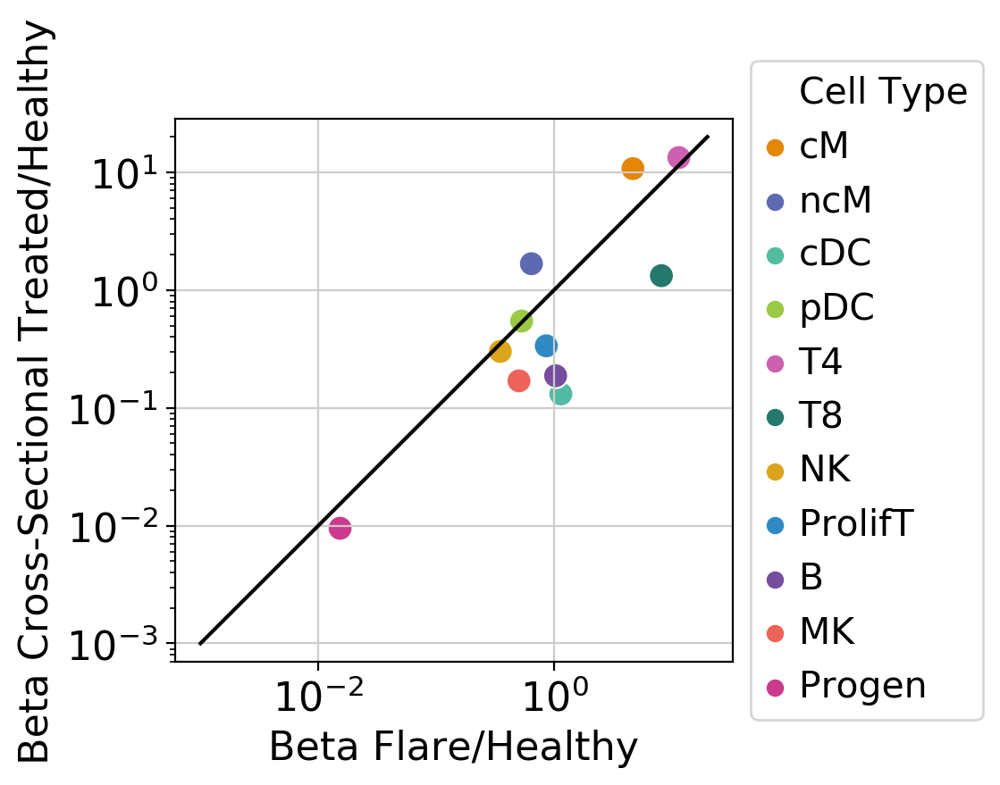

In [18]:
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB', 'RBC']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E"]

# Generate dictionary containing values from cross-sectional dataset.
CROSSTRHEALTHY = {'cM':-10.741421310745048, 'ncM':-1.6742194009077185, 'cDC':0.13125795717366492, 'pDC':0.5457223411567755, 'T4':13.335545671765423, 'T8':-1.3251414780715685, 'NK':0.3014028252276574, 'ProlifT':-0.33624304888249434, 'B':-0.1872977778483561, 'MK':-0.16963446346876693, 'Progen':-0.00949716664002322}
Comparison_plot_data = pd.DataFrame({'UNT/HEALTHY':pd.Series(HEALTHYFLARE_effect), 'Cross_TR/HEALTHY':pd.Series(CROSSTRHEALTHY)})
Comparison_plot_data = Comparison_plot_data.reindex(MasterORDER)
Comparison_plot_data = Comparison_plot_data.dropna()
Comparison_plot_data['Cell Type'] = Comparison_plot_data.index
Comparison_plot_data['UNT/HEALTHY'] = Comparison_plot_data['UNT/HEALTHY'].abs()
Comparison_plot_data['Cross_TR/HEALTHY'] = Comparison_plot_data['Cross_TR/HEALTHY'].abs()
display(Comparison_plot_data)
ax = sns.scatterplot(x="UNT/HEALTHY", y="Cross_TR/HEALTHY", hue='Cell Type', data=Comparison_plot_data, s=100, marker="o", palette=colorrs)
line = np.linspace(0.001, 20, 10)
ax = plt.plot(line, line, color='k')
ax = plt.axis('equal')
ax = plt.xlabel('Beta Flare/Healthy')
ax = plt.ylabel('Beta Cross-Sectional Treated/Healthy')
ax = plt.yscale('log')
ax = plt.xscale('log')
ax = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax = plt.savefig('figures./Flare-Healthy_Effect_size_scatterplot.pdf')
ax = plt.savefig('figures./Flare-Healthy_Effect_size_scatterplot.png')
print(Comparison_plot_data.corr(method='pearson'))


# Fold change scatter plot

,UNT/HEALTHY,Cross_TR/HEALTHY,Cell Type
cM,-0.327545,-0.688771,cM
ncM,0.277092,-0.558104,ncM
cDC,1.383541,0.147678,cDC
pDC,1.657982,1.380221,pDC
T4,0.589506,0.656980,T4
T8,-0.509287,-0.100498,T8
NK,0.068253,0.058098,NK
ProlifT,-1.906668,-1.101802,ProlifT
B,-0.113015,-0.021202,B
Progen,0.416402,-0.162151,Progen


                  UNT/HEALTHY  Cross_TR/HEALTHY
UNT/HEALTHY          1.000000          0.810246
Cross_TR/HEALTHY     0.810246          1.000000
(0.810246272291349, 0.004479838497244486)


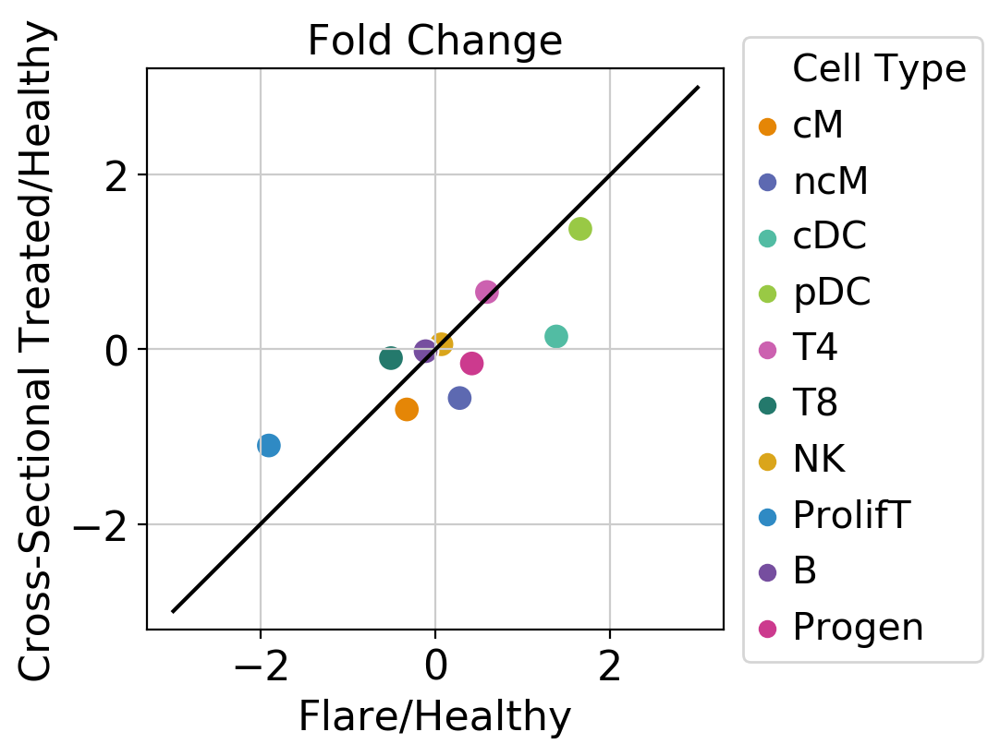

In [19]:
MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'Progen']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#CC3A8E"]

# Generate dictionary containing values from cross-sectional dataset.
CROSSTRHEALTHY = {'cM':  -0.6887710566546117, 'ncM':-0.5581042433372936, 'cDC':0.14767770138323252, 'pDC':1.3802206455290076, 'T4':0.6569801055457304, 'T8':-0.10049816214039477, 'NK':0.05809782022507549, 'ProlifT':-1.1018015246975479, 'B':-0.021202215692427216, 'MK':-1.27679599270261, 'Progen':-0.16215092601029488}
Comparison_plot_data = pd.DataFrame({'UNT/HEALTHY':pd.Series(HEALTHYFLARE_FC), 'Cross_TR/HEALTHY':pd.Series(CROSSTRHEALTHY)})
Comparison_plot_data = Comparison_plot_data.reindex(MasterORDER)
Comparison_plot_data = Comparison_plot_data.dropna()
# Comparison_plot_data = Comparison_plot_data.drop('MK')
Comparison_plot_data['Cell Type'] = Comparison_plot_data.index
display(Comparison_plot_data)
ax = sns.scatterplot(x="UNT/HEALTHY", y="Cross_TR/HEALTHY", hue='Cell Type', data=Comparison_plot_data, s=100, marker="o", palette=colorrs)
line = np.linspace(-3, 3, 10)
ax = plt.plot(line, line, color='k')
ax = plt.axis('equal')
ax = plt.xlabel('Flare/Healthy')
ax = plt.ylabel('Cross-Sectional Treated/Healthy')
ax = plt.title('Fold Change')
ax = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax = plt.savefig('figures./Flare-Healthy_FC_scatterplot.pdf')
ax = plt.savefig('figures./Flare-Healthy_FC_scatterplot.png')
print(Comparison_plot_data.corr(method='pearson'))
Group1 = Comparison_plot_data['UNT/HEALTHY'].tolist()
Group2 = Comparison_plot_data['Cross_TR/HEALTHY'].tolist()
print(stats.pearsonr(Group1, Group2))

# Rituximab patients abundance before & after treatment

In [20]:
%%capture
cdata = adata[adata.obs['ind_cov'].isin(['FLARE013', 'FLARE002', 'FLARE003'])]

ddata=cdata[cdata.obs['ct_cov']=='B']
print(np.sum(ddata.obs['disease_cov']=='Healthy'))
print(np.sum(ddata.obs['disease_cov']=='Flare'))

## Make proportion plots
adata_obs_small = cdata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['pDC', 'iM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em cyto3', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progen',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.rituximab.pdf")

# Feature plots for Untreated Treated pairs

In [21]:
%%capture
pairs = ['FLARE004', 'FLARE009', 'FLARE011', 'FLARE013', 'FLARE016', 'FLARE003', 'FLARE002', 'FLARE008']
colors = ["#000000", "#FF0000"]
for pair in pairs:
    bdata = adata[adata.obs['ind_cov']==pair]
    print(pair)
    sc.pl.umap(bdata, size=10, show=False, color='disease_cov', save=str('TREATED_UNTREATED_PAIR'+ pair + '.disease.png'), palette=colors)
    plt.show() 

... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical


# Higher resolution subpopulation labeling

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
... storing 'ct_group' as categorical


saving figure to file ./figures./umap.figure6c.png


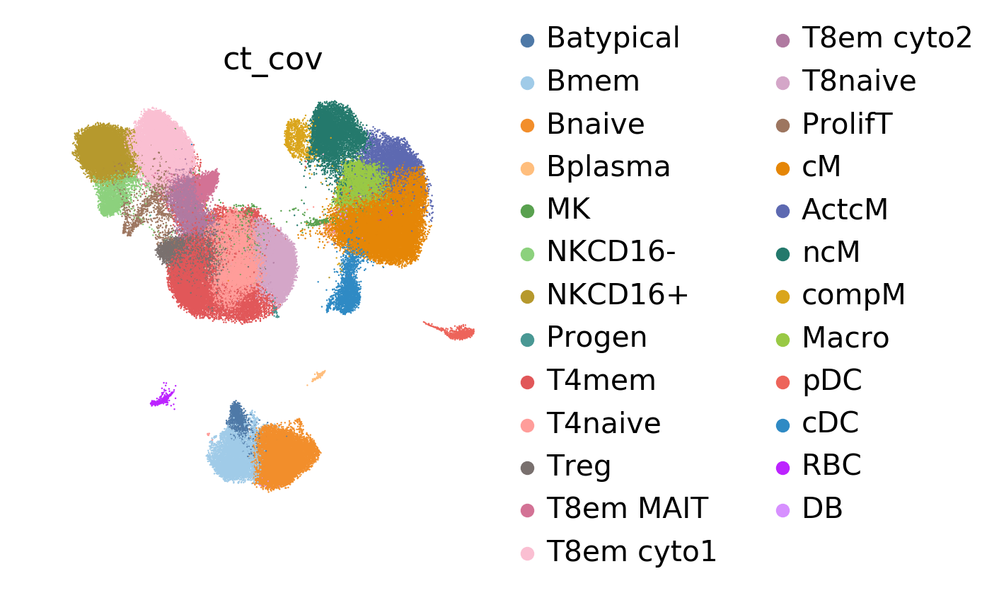

In [22]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "Bnaive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "NKCD16+" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "T8em cyto1" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "T8naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T4naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "T4mem" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T4naive" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "ActcM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "cM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "ncM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "Macro" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "T8em cyto2" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T8em cyto1" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "T4mem" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "Bmem" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "T4naive" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "cM" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "Treg" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "T8em MAIT" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "T4mem" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "NKCD16-" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "MK" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "ProlifT" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "T4mem" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "compM" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "Batypical" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "pDC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "T4naive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "RBC" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "T4mem" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "Bplasma" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "NKCD16-" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "DB" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "Bnaive" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'MK', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T8em cyto2', 'T8naive', 'ProlifT', 'cM', 'ActcM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC', 'RBC', 'DB']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#59A14F","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4', '#BC23FF', '#D790FF']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=3, show=True, edgecolor="none", save='.figure6c.png', palette=colorrs)


# Statistics

In [24]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]


# Filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['ActcM','pDC', 'infM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em MAIT', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono','mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Managed'])]
HEALTHYMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated'])]
HEALTHYTREATED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Treated"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYTREATED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Flare'])]
HEALTHYFLARE_effect = {}
HEALTHYFLARE_FC = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYFLARE_effect[ct] = effect
    HEALTHYFLARE_FC[ct] = math.log2(sum(est.params)/est.params[0])
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Flare'])]
TREATEDFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Managed'])]
TREATEDMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,0.09708574749457986,Batypical,0.135265
1,2.967883150468201,Bmem,0.009567
2,-2.5783457759301247,Bnaive,0.214172
3,-0.03213265827977511,Bplasma,0.451432
4,0.6146578448617228,MK,0.011250
5,0.42128493363008945,NKCD16-,0.100307
6,-0.9334344436374948,NKCD16+,0.556781
7,0.029349768533405277,Progen,0.117739
8,0.6405931979064743,T4mem,0.738855
9,15.233930383788234,T4naive,0.000131


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.15072299655065804,Batypical,0.100689
1,3.752089588089703,Bmem,0.002435
2,2.3775816570676493,Bnaive,0.231799
3,-0.12845370574575055,Bplasma,0.081659
4,0.45948492530960466,MK,0.051472
5,0.06835802378863504,NKCD16-,0.837616
6,-5.584523088834793,NKCD16+,0.019674
7,-0.1003890692164899,Progen,0.007734
8,3.7116582408944008,T4mem,0.032991
9,13.374673787692815,T4naive,0.000301


as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-1.2987628777102465,Batypical,0.029221
1,2.147079410237305,Bmem,0.009656
2,-1.7948228474544234,Bnaive,0.447997
3,-0.0887545246093075,Bplasma,0.057764
4,0.5042368410789463,MK,0.002026
5,0.37818397591311276,NKCD16-,0.112860
6,-0.07065821802664018,NKCD16+,0.955879
7,0.015301118086850982,Progen,0.240947
8,2.6960094749568437,T4mem,0.014563
9,10.17533021743548,T4naive,0.000085


as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-1.1480398811595882,Batypical,0.281180
1,-1.6050101778523986,Bmem,0.060371
2,-4.172404504522076,Bnaive,0.355520
3,0.03969918113644312,Bplasma,0.760329
4,0.04475191576934177,MK,0.772060
5,0.3098259521244776,NKCD16-,0.446095
6,5.5138648708081455,NKCD16+,0.053735
7,0.11569018730334081,Progen,0.000966
8,-1.0156487659375553,T4mem,0.504850
9,-3.1993435702573265,T4naive,0.122083


as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,0.2478087440452377,Batypical,0.049971
1,-0.7842064376215045,Bmem,0.086807
2,-4.955927432997777,Bnaive,0.163080
3,0.09632104746597542,Bplasma,0.575155
4,0.15517291955211826,MK,0.431842
5,0.3529269098414545,NKCD16-,0.457227
6,4.6510886451972935,NKCD16+,0.263507
7,0.1297388377498952,Progen,0.027348
8,-3.0710650429879243,T4mem,0.315696
9,1.859256596095419,T4naive,0.299912


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.009980078877755072,Batypical,8.837175e-01
1,3.314425314555734,Bmem,1.689481e-04
2,-0.7031771079030703,Bnaive,6.832770e-01
3,-0.07444985375864471,Bplasma,1.501903e-01
4,0.5419458894750178,MK,2.809443e-03
5,0.2559081024328108,NKCD16-,3.065494e-01
6,-3.112872396118683,NKCD16+,1.029506e-01
7,0.004618281794784844,Progen,8.455100e-01
8,2.07965321585249,T4mem,1.868361e-01
9,14.362707601759432,T4naive,8.862267e-07


as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.15072299655065804,Batypical,0.100689
1,3.752089588089703,Bmem,0.002435
2,2.3775816570676493,Bnaive,0.231799
3,-0.12845370574575055,Bplasma,0.081659
4,0.45948492530960466,MK,0.051472
5,0.06835802378863504,NKCD16-,0.837616
6,-5.584523088834793,NKCD16+,0.019674
7,-0.1003890692164899,Progen,0.007734
8,3.7116582408944008,T4mem,0.032991
9,13.374673787692815,T4naive,0.000301


# Macrophage analysis

In [25]:
getproportions(celltype='Macro',group1='Healthy', group2='Managed')
healthy = ind_perc[ind_perc.disease_cov=='Healthy'][ind_perc.ct_cov=='Macro'].ct_perc.tolist()
flare = ind_perc[ind_perc.disease_cov=='Managed'][ind_perc.ct_cov=='Macro'].ct_perc.tolist()
display(stats.ranksums(healthy, flare))

Healthy proportion for celltype: Macro: 0.23388239513693646
Managed proportion for celltype: Macro: 4.524661908535824


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


RanksumsResult(statistic=-2.6423130363032654, pvalue=0.008234191254690226)

ranking genes


... storing 'ct_group' as categorical
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


    finished (0:00:01.48)


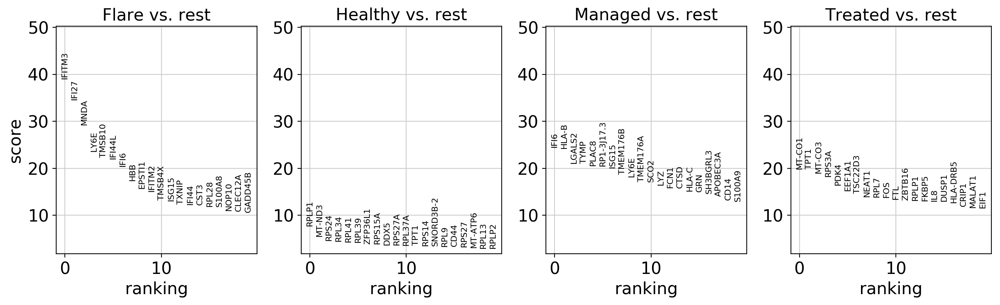

In [26]:
bdata = adata[adata.obs['ct_cov']=='Macro']
sc.tl.rank_genes_groups(bdata, groupby='disease_cov')
sc.pl.rank_genes_groups(bdata)

In [27]:
MacroFlare = []
MacroHealthy = []
MacroManaged = []
MacroTreated = []
tuplelist = bdata.uns['rank_genes_groups']['names'].tolist()
for ii in range(len(tuplelist)):
    MacroFlare.append(tuplelist[ii][0])
    MacroHealthy.append(tuplelist[ii][1])
    MacroManaged.append(tuplelist[ii][2])
    MacroTreated.append(tuplelist[ii][3])
MacroFrame = pd.DataFrame({'Flare':MacroFlare, 'Healthy':MacroHealthy, 'Managed':MacroManaged, 'Treated':MacroTreated})
MacroFrame.to_csv('MacroDiffGenes.csv')

# Lymphocytes

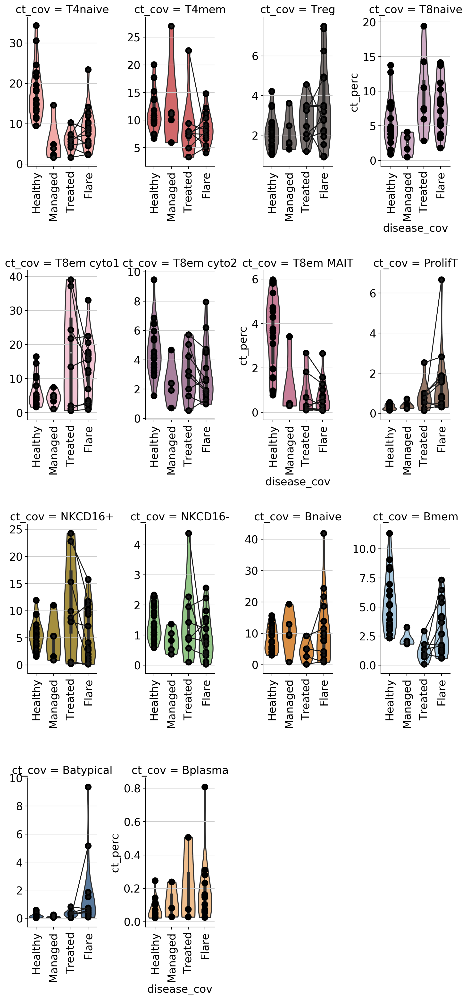

In [28]:
ORDER = ['T4naive', 'T4mem', 'Treg', 'T8naive', 'T8em cyto1', 'T8em cyto2', 'T8em MAIT', 'ProlifT', 'NKCD16+', 'NKCD16-', 'Bnaive', 'Bmem', 'Batypical', 'Bplasma',
        ]

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', order=[ "Healthy", "Managed", "Treated", "Flare"], col_order=ORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]    
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.figure6dlymphct.png")


# Monocytes

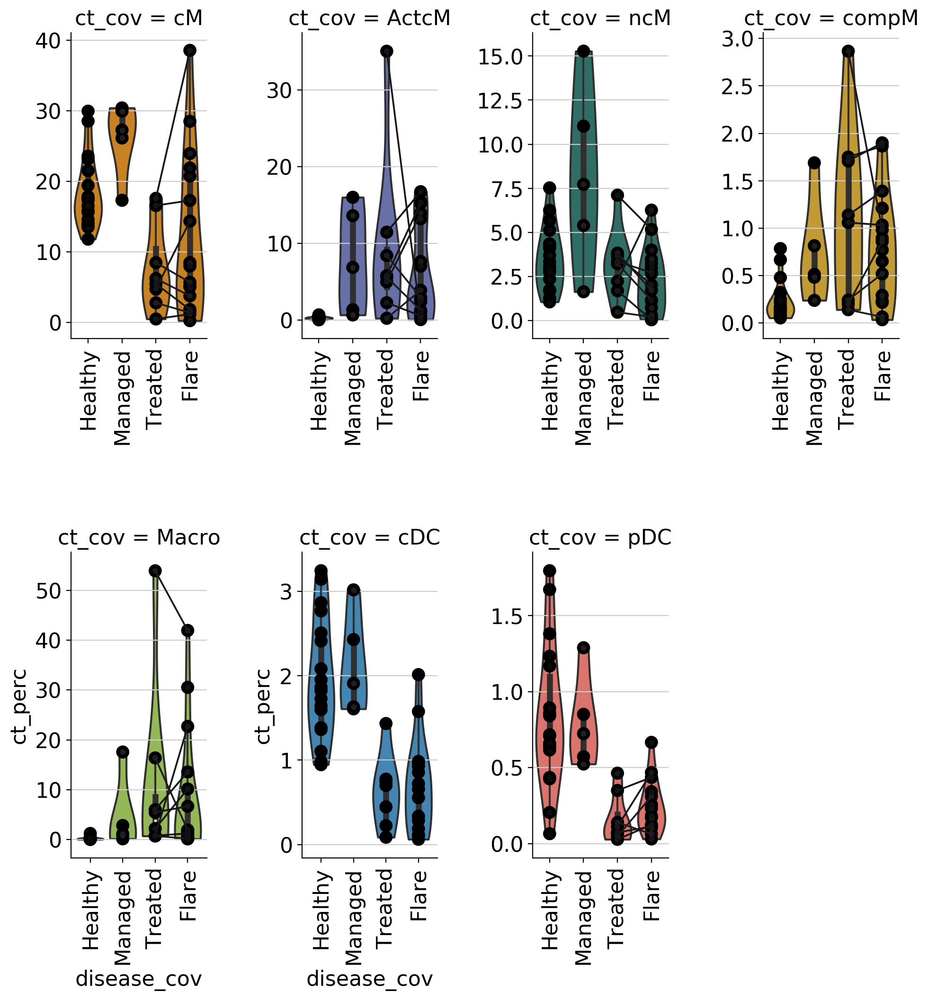

In [29]:
ORDER = ['cM','ActcM','ncM', 'compM', 'Macro', 'cDC', 'pDC'
        ]
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin',order=[ "Healthy", "Managed", "Treated", "Flare"], col_order=ORDER, col='ct_cov', col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
   
perc_plot.savefig(figdir+"/violin.figure6dmonoct.png")

# Other Cell Types

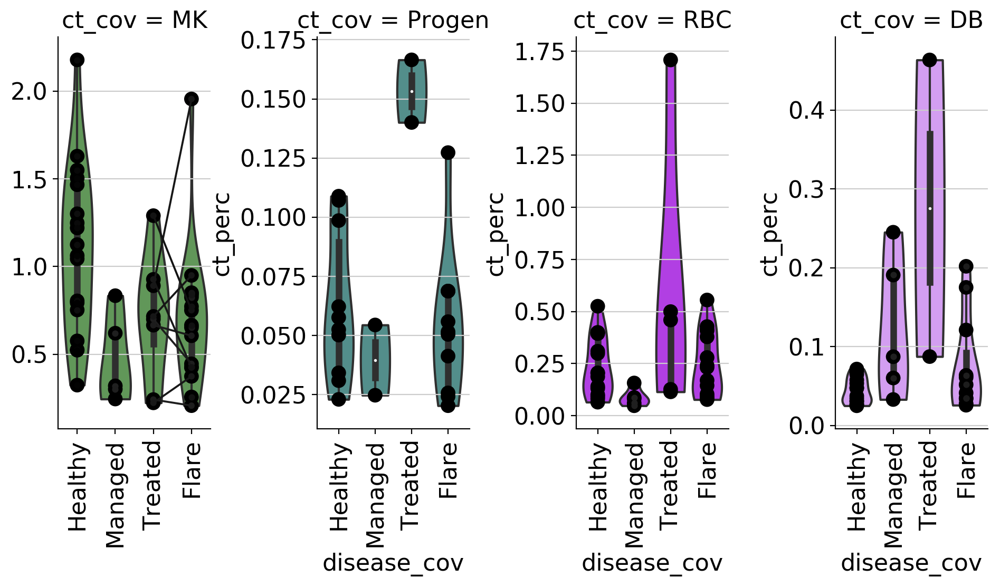

In [30]:
ORDER = ['MK', 'Progen', 'RBC', 'DB'
        ]
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin',order=[ "Healthy", "Managed", "Treated", "Flare"], col_order=ORDER, col='ct_cov', col_wrap=7, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.figure6dotherct.png")

# Effect size scatter plot

,UNT/HEALTHY,Cross_TR/HEALTHY,Cell Type
Batypical,1.298763,0.046606,Batypical
Bmem,2.147079,2.584895,Bmem
Bnaive,1.794823,2.791722,Bnaive
Bplasma,0.088755,0.026583,Bplasma
MK,0.504237,0.550410,MK
NKCD16-,0.378184,0.043210,NKCD16-
NKCD16+,0.070658,0.124469,NKCD16+
Progen,0.015301,0.438594,Progen
T4mem,2.696009,2.085932,T4mem
T4naive,10.175330,12.651778,T4naive


                  UNT/HEALTHY  Cross_TR/HEALTHY
UNT/HEALTHY          1.000000          0.787204
Cross_TR/HEALTHY     0.787204          1.000000


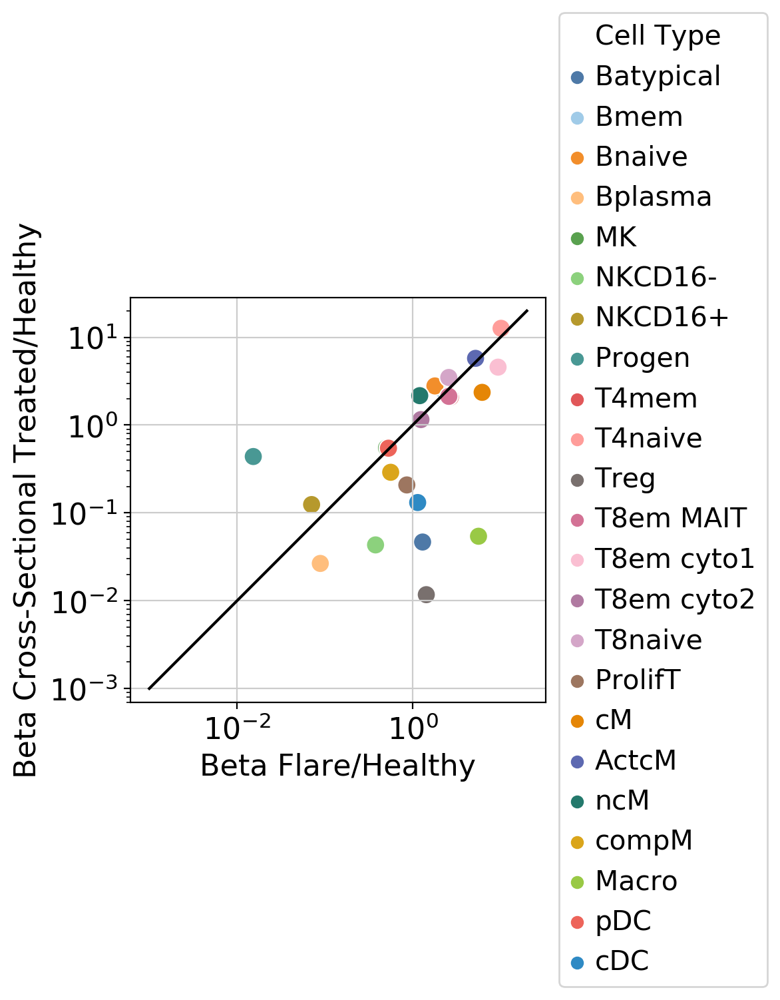

In [31]:
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'MK', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T8em cyto2', 
               'T8naive', 'ProlifT', 'cM', 'ActcM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#59A14F","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4']

# Generate dictionary containing values from cross-sectional dataset.
CROSSTRHEALTHY = {'Batypical':-0.04660550052009935, 'Bmem':2.5848954276333918, 'Bnaive':-2.791721747149453, 'Bplasma':-0.026582802352059197, 'MK':0.5504103573271134,'NKCD16-':0.04321027880173084, 'NKCD16+':0.12446914833438122,
                 'Progen':0.4385938985860165, 'T4mem':-2.085932090715172, 'T4naive':12.65177804972718, 'Treg':0.011720374567987996, 'T8em MAIT':2.124190130207837, 'T8em cyto1':-4.569644610540978, 'T8em cyto2':-1.1550718185509596,
                 'T8naive':3.4865647863078855, 'ProlifT':-0.20821975040448304, 'cM':-2.359728159036588, 'ActcM':-5.756097081131859, 'ncM':-2.1640225205030905, 'compM':-0.29015548287165194, 'Macro':-0.054227405885961324, 'pDC':0.5457223411567755, 'cDC':0.13125795717366492}
Comparison_plot_data = pd.DataFrame({'UNT/HEALTHY':pd.Series(HEALTHYFLARE_effect), 'Cross_TR/HEALTHY':pd.Series(CROSSTRHEALTHY)})
Comparison_plot_data = Comparison_plot_data.reindex(MasterORDER)
Comparison_plot_data = Comparison_plot_data.dropna()
Comparison_plot_data['Cell Type'] = Comparison_plot_data.index
Comparison_plot_data['UNT/HEALTHY'] = Comparison_plot_data['UNT/HEALTHY'].abs()
Comparison_plot_data['Cross_TR/HEALTHY'] = Comparison_plot_data['Cross_TR/HEALTHY'].abs()
display(Comparison_plot_data)
ax = sns.scatterplot(x="UNT/HEALTHY", y="Cross_TR/HEALTHY", hue='Cell Type', data=Comparison_plot_data, s=100, marker="o", palette=colorrs)
line = np.linspace(0.001, 20, 10)
ax = plt.plot(line, line, color='k')
ax = plt.axis('equal')
ax = plt.xlabel('Beta Flare/Healthy')
ax = plt.ylabel('Beta Cross-Sectional Treated/Healthy')
ax = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax = plt.yscale('log')
ax = plt.xscale('log')
ax = plt.savefig('figures./Flare-Healthy_Effect_size_scatterplot_subpops.pdf')
ax = plt.savefig('figures./Flare-Healthy_Effect_size_scatterplot_subpops.png')
print(Comparison_plot_data.corr(method='pearson'))


# Fold change scatter plot

,UNT/HEALTHY,Cross_TR/HEALTHY,Cell Type
Batypical,-3.070896,-0.635819,Batypical
Bmem,0.795412,0.926087,Bmem
Bnaive,-0.315016,-0.362132,Bnaive
Bplasma,-1.233971,-0.579483,Bplasma
NKCD16-,0.428970,0.151056,NKCD16-
NKCD16+,-0.016601,0.270683,NKCD16+
Progen,0.416402,0.588935,Progen
T4mem,0.374476,-0.500711,T4mem
T4naive,1.027771,1.353136,T4naive
Treg,-0.688014,0.065184,Treg


                  UNT/HEALTHY  Cross_TR/HEALTHY
UNT/HEALTHY          1.000000          0.728114
Cross_TR/HEALTHY     0.728114          1.000000
(0.728113964984862, 0.00012225513210558885)


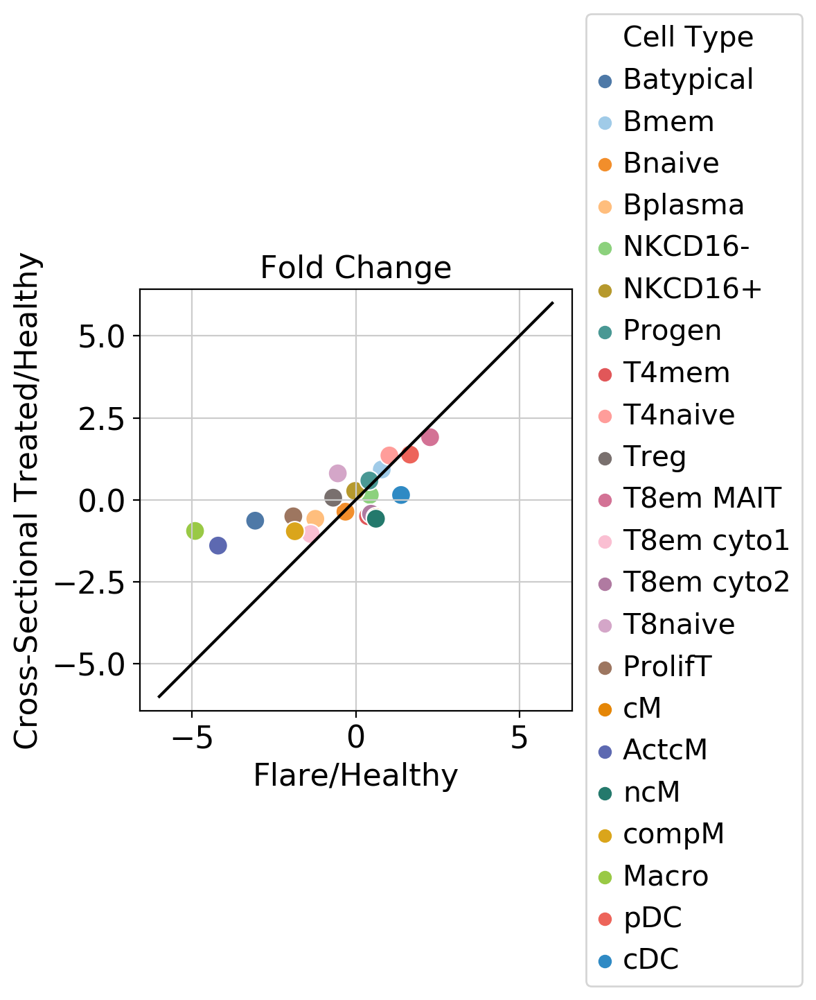

In [32]:
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T8em cyto2', 
               'T8naive', 'ProlifT', 'cM', 'ActcM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4']

# Generate dictionary containing values from cross-sectional dataset.
CROSSTRHEALTHY = {'Batypical':-0.6358190013713237, 'Bmem':0.9260874221944239, 'Bnaive':-0.36213153583353885, 'Bplasma':-0.5794826539383741,'NKCD16-':0.15105621995364227, 'NKCD16+':0.27068264275553616,
                 'Progen':0.5889345378422507, 'T4mem':-0.5007107616707662, 'T4naive':1.353135973440814, 'Treg':0.06518415614979964, 'T8em MAIT':1.9104997563704227, 'T8em cyto1':-1.0423830556988225, 'T8em cyto2':-0.4240151064438552,
                 'T8naive':0.8071953626892797, 'ProlifT':-0.5033927107774201, 'cM':-0.5303654692368822, 'ActcM':-1.3961545337623849, 'ncM':-0.576567367096294, 'compM':-0.9578572911380019, 'Macro':-0.9490776259674889, 'pDC':1.3802206455290076, 'cDC':0.14767770138323252}

Comparison_plot_data = pd.DataFrame({'UNT/HEALTHY':pd.Series(HEALTHYFLARE_FC), 'Cross_TR/HEALTHY':pd.Series(CROSSTRHEALTHY)})
Comparison_plot_data = Comparison_plot_data.reindex(MasterORDER)
Comparison_plot_data = Comparison_plot_data.dropna()
Comparison_plot_data['Cell Type'] = Comparison_plot_data.index
display(Comparison_plot_data)
ax = sns.scatterplot(x="UNT/HEALTHY", y="Cross_TR/HEALTHY", hue='Cell Type', data=Comparison_plot_data, s=100, marker="o", palette=colorrs)
line = np.linspace(-6, 6, 10)
ax = plt.plot(line, line, color='k')
ax = plt.axis('equal')
ax = plt.xlabel('Flare/Healthy')
ax = plt.ylabel('Cross-Sectional Treated/Healthy')
ax = plt.title('Fold Change')
ax = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax = plt.savefig('figures./Flare-Healthy_FC_scatterplot_subpops.pdf')
ax = plt.savefig('figures./Flare-Healthy_FC_scatterplot_subpops.png')
print(Comparison_plot_data.corr(method='pearson'))
Group1 = Comparison_plot_data['UNT/HEALTHY'].tolist()
Group2 = Comparison_plot_data['Cross_TR/HEALTHY'].tolist()
print(stats.pearsonr(Group1, Group2))

# Cell type correlations with cross-sectional data

In [33]:
# Load cross-sectional lymph data
lymph = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure4.lymphoid.T/lymph_expr.ct_cov.csv')
lymph.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
lymph = lymph.set_index('Gene')
del lymph.index.name
# lymph data genes
lymphgenes = lymph.index.tolist()
# Intersection of genes for lymph
flaredata = adata[:, adata.var_names.isin(lymphgenes)]
marker_dictionary = pd.DataFrame({"all": flaredata.var_names})
flarelymph = marker_gene_expression(flaredata, marker_dictionary, partition_key="leiden")
lymphresult = pd.concat([lymph, flarelymph], axis=1, join='inner')

mono = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure3.myeloid/myeloid_expr.ct_cov.csv')
mono.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
mono = mono.set_index('Gene')
del mono.index.name
# mono data genes
monogenes = mono.index.tolist()
# Intersection of genes for mono
flaredata = adata[:, adata.var_names.isin(monogenes)]
marker_dictionary = pd.DataFrame({"all": flaredata.var_names})
flaremono = marker_gene_expression(flaredata, marker_dictionary, partition_key="leiden")
monoresult = pd.concat([mono, flaremono], axis=1, join='inner')



Lymphocyte


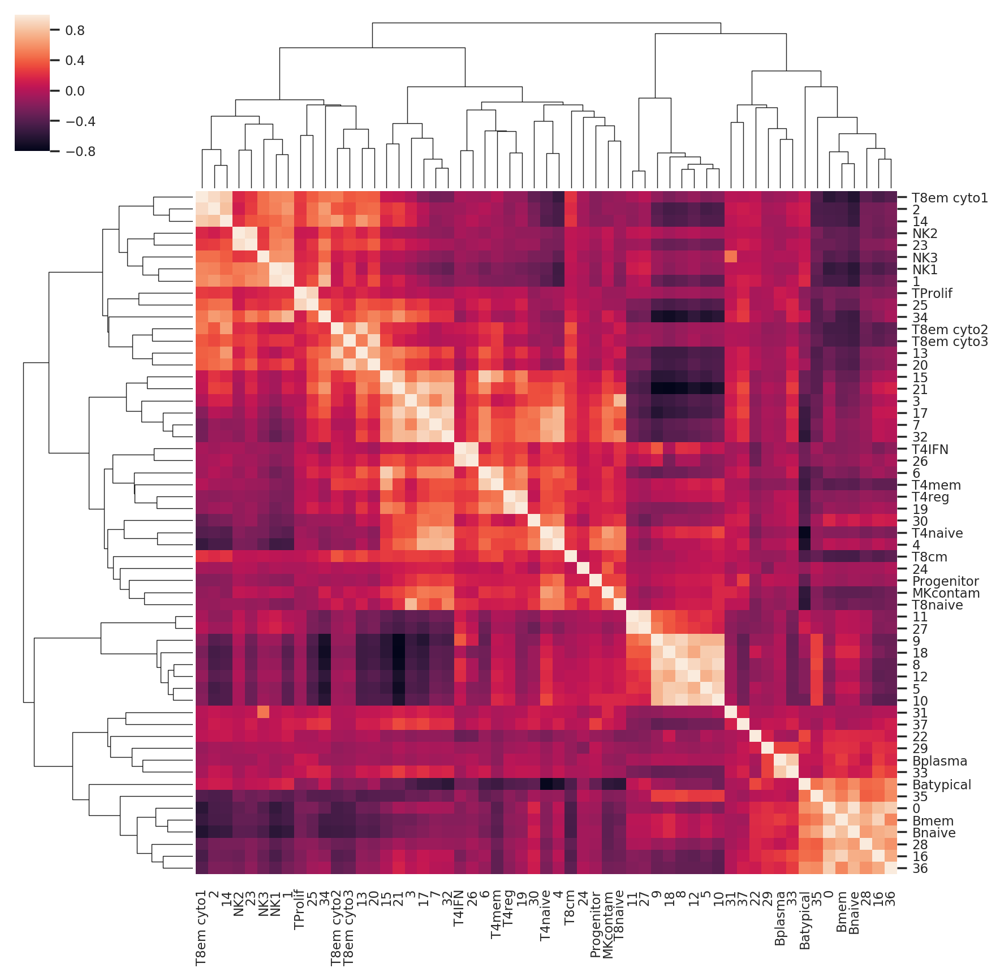

In [34]:
print('Lymphocyte')
lymphcorr = lymphresult.corr()
lymphcorr.to_csv('Lymphocyte_CrossX_Flare_Correlations.csv')
lymphcorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(lymphcorr, yticklabels=True, xticklabels=True)
g.savefig("Lymphocyte_CrossX_Flare_Correlations.png")

Myeloid


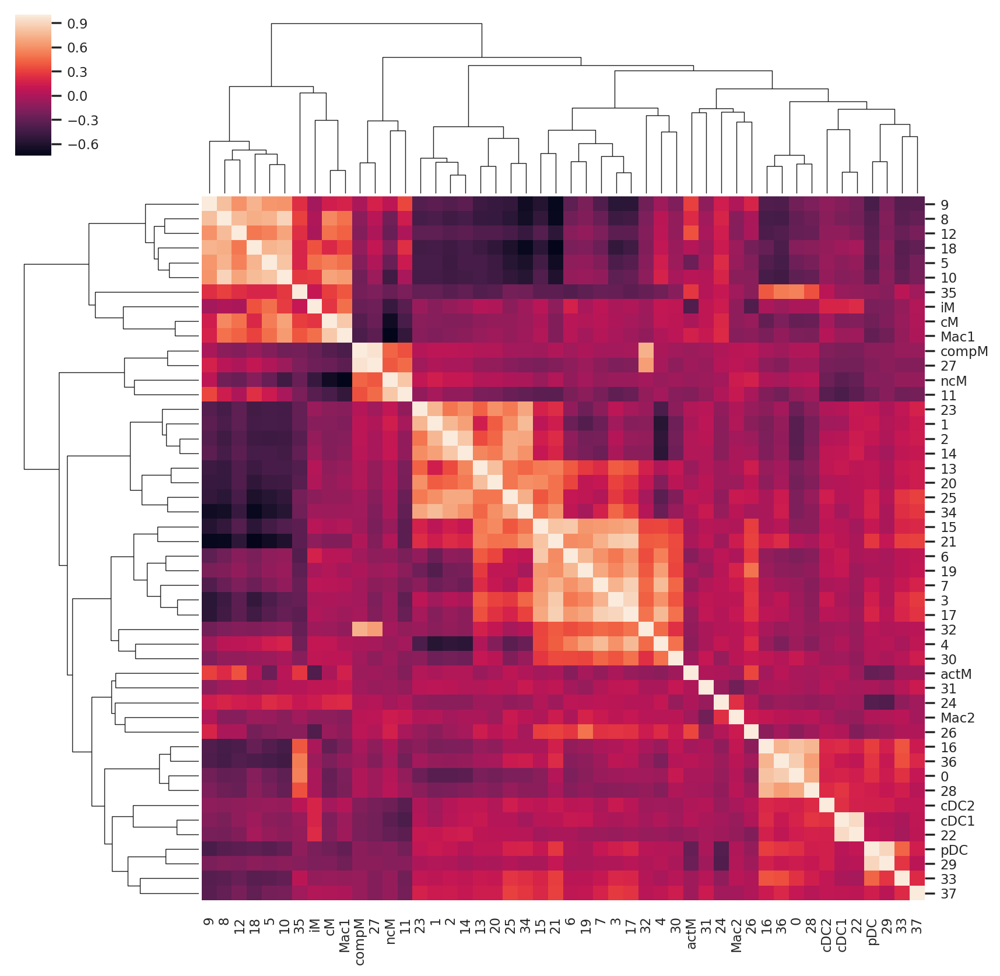

In [35]:
print('Myeloid')
monocorr = monoresult.corr()
monocorr.to_csv('Myeloid_CrossX_Flare_Correlations.csv')
monocorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(monocorr, yticklabels=True, xticklabels=True)
g.savefig("Myeloid_CrossX_Flare_Correlations.png")

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


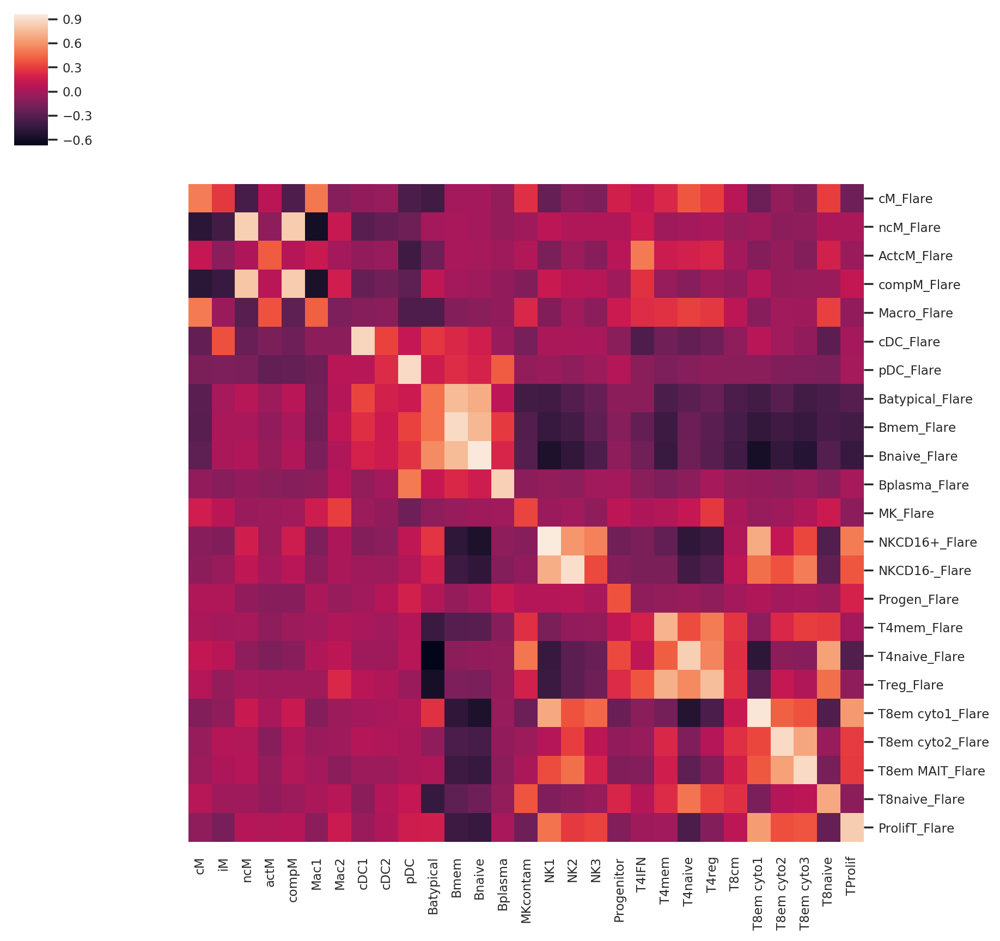

In [36]:
adata.obs['ct_cov_Flr'] = adata.obs['ct_cov'].astype('object')
# # ## do some manual cell type assignment
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "0"] = "Bnaive_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "1"] = "NKCD16+_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "2"] = "T8em cyto1_Flare" ## good                                                                                     
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "3"] = "T8naive_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "4"] = "T4naive_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "5"] = "cM_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "6"] = "T4mem_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "7"] = "T4naive_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "8"] = "cM_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "9"] = "ActcM_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "10"] = "cM_Flare" ## good                                                                                  
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "11"] = "ncM_Flare" ## good                                                                                    
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "12"] = "Macro_Flare" ## good                                                                                   
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "13"] = "T8em cyto2_Flare" ## good                                                                                   
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "14"] = "T8em cyto1_Flare" ## good                                                                                  
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "15"] = "T4mem_Flare" ## good                                                                                   
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "16"] = "Bmem_Flare" ## good                                                                                   
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "17"] = "T4naive_Flare" ## good                                                                                  
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "18"] = "cM_Flare" ## good                                                                              
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "19"] = "Treg_Flare" ## good                                                                               
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "20"] = "T8em MAIT_Flare" ## good                                                                                   
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "21"] = "T4mem_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "22"] = "cDC_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "23"] = "NKCD16-_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "24"] = "MK_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "25"] = "ProlifT_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "26"] = "T4mem_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "27"] = "compM_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "28"] = "Batypical_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "29"] = "pDC_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "30"] = "T4naive_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "31"] = "RBC_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "32"] = "T4mem_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "33"] = "Bplasma_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "34"] = "NKCD16-_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "35"] = "DB_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "36"] = "Bnaive_Flare" ##
adata.obs['ct_cov_Flr'].loc[adata.obs.leiden == "37"] = "Progen_Flare" ##
adata.obs['ct_cov_Flr'] = adata.obs['ct_cov_Flr'].astype('category')

catORDER = ['cM_Flare', 'ncM_Flare', 'ActcM_Flare', 'compM_Flare', 'Macro_Flare', 'cDC_Flare', 'pDC_Flare', 'Batypical_Flare', 'Bmem_Flare', 'Bnaive_Flare',
                                                                 'Bplasma_Flare', 'MK_Flare', 'NKCD16+_Flare', 'NKCD16-_Flare', 'Progen_Flare', 'T4mem_Flare', 'T4naive_Flare', 'Treg_Flare', 'T8em cyto1_Flare', 'T8em cyto2_Flare', 'T8em MAIT_Flare', 
                                                                 'T8naive_Flare', 'ProlifT_Flare', 'DB_Flare', 'RBC_Flare']
adata.obs['ct_cov_Flr'] = adata.obs['ct_cov_Flr'].cat.reorder_categories(catORDER)


# Load cross-sectional lymph data
lymph = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure4.lymphoid.T/lymph_expr.ct_cov.csv')
lymph.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
lymph = lymph.set_index('Gene')
del lymph.index.name
mono = pd.read_csv('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/lupus_paper/figure3.myeloid/myeloid_expr.ct_cov.csv')
mono.rename(columns={'Unnamed: 0':'Gene'}, inplace=True)
mono = mono.set_index('Gene')
del mono.index.name

marker_dictionary = pd.DataFrame({"all": adata.var_names})
flare = marker_gene_expression(adata, marker_dictionary, partition_key="ct_cov_Flr")
flare = flare.drop(labels=['DB_Flare', 'RBC_Flare'], axis=1)
corrresult = pd.concat([mono, lymph, flare], axis=1, join='inner')

crossX_Flarecorr = corrresult.corr()
# Remove duplicate labels from column (the diagnal of correlation plot)
crossX_Flarecorr = crossX_Flarecorr.drop(columns=catORDER[:-2])
# Remove columns headers from row
crossX_Flarecorr = crossX_Flarecorr.drop(labels=list(crossX_Flarecorr.columns.values))
crossX_Flarecorr.to_csv('CrossX_Flare_Correlations.csv')
crossX_Flarecorr.style.background_gradient(cmap='coolwarm').set_precision(2)
import seaborn as sns; sns.set(color_codes=True); sns.set(font_scale=0.75)
g = sns.clustermap(crossX_Flarecorr, yticklabels=True, xticklabels=True, col_cluster=False, row_cluster=False)
g.savefig("figures./CrossX_Flare_pop_Correlations.png")


# Map colors onto cell type labels

In [37]:
colormapping = dict()
unique_ct = adata.obs.ct_cov.cat.categories.tolist()
for ii in range(len(unique_ct)):
    colormapping[unique_ct[ii]] = adata.uns['ct_cov_colors'][ii]

In [38]:
# Atypical memory B cells
sc.pl.umap(adata, color=['CR2', 'CD27', 'FCRL5', 'ITGAX', 'NKG7'],show=False, save='.AtypicalBgenes.png')

... storing 'ct_group' as categorical


saving figure to file ./figures./umap.AtypicalBgenes.png


In [39]:
# Macro
sc.pl.umap(adata, color='CD163', size=3, show=False, edgecolor="none", save='.CD163_expression.png')

saving figure to file ./figures./umap.CD163_expression.png


In [40]:
ddata = adata[adata.obs['ct_cov']=='ProlifT']
sc.pl.violin(ddata,keys=['CD8A', 'CD3D'], groupby='disease_cov',show=False, save='.Tprolif_CD8A.png')


saving figure to file ./figures./violin.Tprolif_CD8A.png


In [41]:
sc.pl.umap(adata, color=['CD4', 'CD8A'], save='.ruleoutDoublePositive.png')


saving figure to file ./figures./umap.ruleoutDoublePositive.png


In [42]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='.platelet.png')

saving figure to file ./figures./umap.platelet.png


In [43]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='.cycling.png')

saving figure to file ./figures./umap.cycling.png


In [44]:
## MACROPHAGES
sc.pl.umap(adata, color=['CD163', 'HLA-DRB1', 'C1QA', 'IFITM3'], size=3, show=False, save=".MACRO.png")

saving figure to file ./figures./umap.MACRO.png


In [45]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1", "FCGR3A", 'NKG7', 'IFNG', 'GZMB', 'PRF1'],size=3, show=False, save=".TNK.png")
# Two NK sub populations: CD56high/lowCD16high/low, CD56lowCD16high
# https://www.frontiersin.org/files/Articles/162361/fimmu-06-00567-HTML/image_m/fimmu-06-00567-g001.jpg

saving figure to file ./figures./umap.TNK.png


In [46]:
#sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
#sc.pl.stacked_violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
sc.pl.umap(adata, color=['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'],size=3, show=False, use_raw=True, save=".gzmbgenes.png")
sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')
#sc.pl.stacked_violin(adata, var_names= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')


saving figure to file ./figures./umap.gzmbgenes.png
saving figure to file ./figures./violin.T8emcyto1expression_raw.png


In [47]:
## Memory vs. helper vs. naive
sc.pl.umap(adata, color=["CCR7","IL7R","S100A4","CD58", 'FAS', 'IL2RA'],show=False, size=3, save=".TMemThTNaive.png")

saving figure to file ./figures./umap.TMemThTNaive.png


In [48]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3, save=".TREG.png")

saving figure to file ./figures./umap.TREG.png


In [49]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3, save=".Y.png")

saving figure to file ./figures./umap.Y.png


In [50]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A", 'CD27', 'FCRL5', 'IL6', 'FCRLA', 'FCRL3'],size=3, save=".B.png")

saving figure to file ./figures./umap.B.png


saving figure to file ./figures./umap.B.png


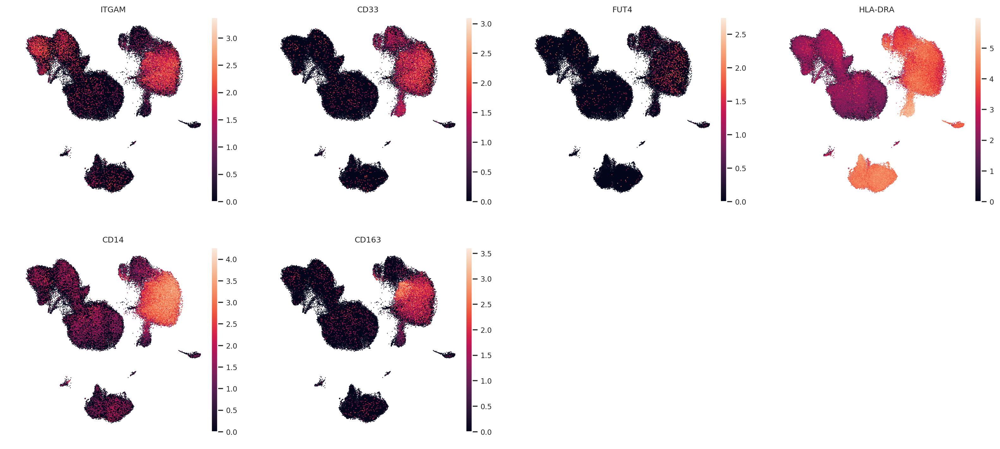

In [51]:
sc.pl.umap(adata, color=['ITGAM', 'CD33', 'FUT4', 'HLA-DRA', 'CD14', 'CD163'],size=3, show=True, save=".B.png")

# Lymphocyte and Monocyte proportions

saving figure to file ./figures./umap.ct_group.png


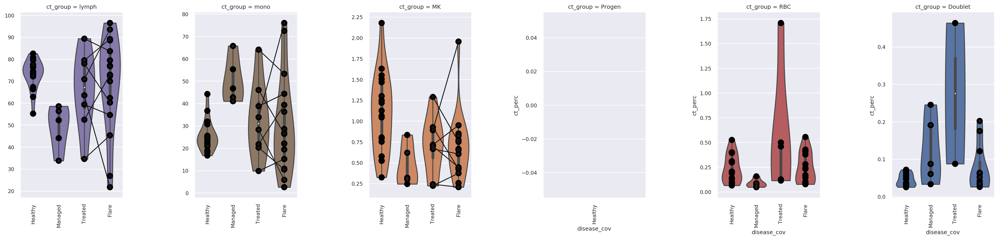

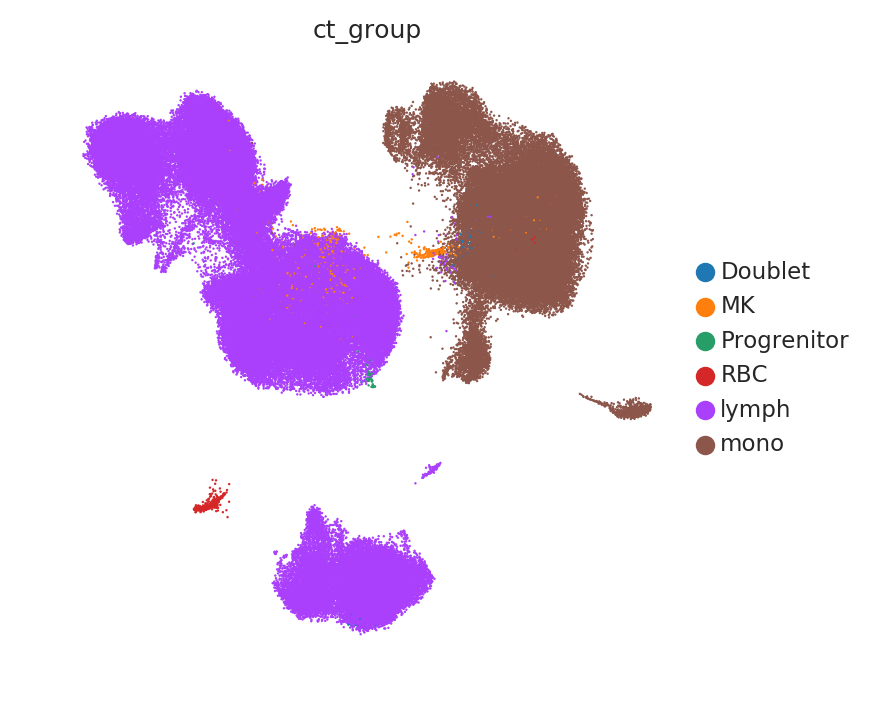

In [52]:
## Make proportion plots
adata_obs_small = adata.obs
## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_group','disease_cov', 'ind_cov'])['ct_group'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_group')
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_group = ind_perc.ct_group.astype('category')
# Reorder categories for plotting
ORDER = ['lymph', 'mono', 'MK', 'Progen', 'RBC', 'Doublet']
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_group', col_order=ORDER,order=[ "Healthy", "Managed", "Treated", "Flare"], data=ind_perc, kind='violin', col='ct_group', cut=0, dodge=False, aspect=0.75, sharex=False, sharey=False)

for ct_i in list(range(len(ORDER))) :
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_group == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[0, ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_group == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[0,ct_i])
    except:
        continue
    perc_plot.axes[0, ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[0, ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[0, ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_group.png")
sc.pl.umap(adata, color='ct_group', show=True, size=3, save='.ct_group', edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy)

# Protein analysis

In [53]:
adata.obs['ct_cov_11'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "0"] = "B" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "1"] = "NK" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "2"] = "T8" ## good                                                                                     
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "3"] = "T8" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "4"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "5"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "6"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "7"] = "T4" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "8"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "10"] = "cM" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "11"] = "ncM" ## good                                                                                    
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "13"] = "T8" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "14"] = "T8" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "15"] = "T4" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "16"] = "B" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "17"] = "T4" ## good                                                                                  
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "18"] = "cM" ## good                                                                              
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "19"] = "T4" ## good                                                                               
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "20"] = "T8" ## good                                                                                   
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "21"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "22"] = "cDC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "23"] = "NK" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "24"] = "MK" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "25"] = "ProlifT" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "26"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "27"] = "ncM" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "28"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "29"] = "pDC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "30"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "31"] = "RBC" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "32"] = "T4" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "33"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "34"] = "NK" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "35"] = "DB" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "36"] = "B" ##
adata.obs['ct_cov_11'].loc[adata.obs.leiden == "37"] = "Progen" ##
adata.obs['ct_cov_11'] = adata.obs.ct_cov_11.astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [54]:
pdata = adata.copy()
print(pdata)

AnnData object with n_obs × n_vars = 153955 × 1164 
    obs: 'SOURCE', 'batch_cov', 'ind_cov', 'well', 'Female', 'pop_cov', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC3', 'PC16', 'steroid', 'plaquenil', 'cellcept', 'cyclophosphamide', 'rituxumab', 'louvain', 'leiden', 'site', 'disease_pop_site_cov', 'ind_cov_disease_cov', 'umap_density_disease_cov', 'ct_cov', 'ct_group', 'ct_cov_Flr', 'ct_cov_11'
    uns: 'barcodes', 'diffmap_e

In [55]:
import anndata as ad
import combat2
import combat
import patsy
# Find antibodies
ab_names = [ab for ab in pdata.obs_keys() if 'pAbO' in ab]
print(ab_names)
obs = pd.DataFrame()
obs['disease_cov'] = pdata.obs['disease_cov']
pdata.obs['batch_cov'] = pdata.obs['batch_cov'].astype('str')
obs['batch_cov'] = pdata.obs['batch_cov']
obs['well'] = pdata.obs['well']
obs['Female'] = pdata.obs['Female']
obs['ct_cov_rna'] = pdata.obs['ct_cov']
obs['ind_cov'] = pdata.obs['ind_cov']
obs['ct_cov_rna_11'] = pdata.obs['ct_cov_11']
var = pd.DataFrame(index=ab_names)
pdatapseudo = ad.AnnData(pdata.obs[ab_names].values, obs=obs, var=var, dtype='float64')
print(pdatapseudo)

# Add the total counts per cell as observations-annotation to pdatapseudo
pdatapseudo.obs['n_counts'] = np.ravel(pdatapseudo.X.sum(axis=1))
print('Normalizing total counts to 10,000')
sc.pp.normalize_per_cell(pdatapseudo, counts_per_cell_after=1e4)
print('Log transforming data')
sc.pp.log1p(pdatapseudo)
print('Making .obs into categories')
pdatapseudo.strings_to_categoricals()
sc.pp.scale(pdatapseudo, max_value=10)
## compute PCA
sc.pp.pca(pdatapseudo, random_state=1, svd_solver='arpack')
regressors = ['n_counts', 'Female'] # Add batch_cov?
print('Regressing out total nUMIs, and gender')
print('regressors: '+str(regressors))
sc.pp.regress_out(pdatapseudo, regressors)
print('Scaling expression data')
sc.pp.scale(pdatapseudo, max_value=10)


## combat adjustment                                                                                                                                                                                                           
print('Running combat')
mod = patsy.dmatrix("~ disease_cov", pdatapseudo.obs, return_type="dataframe")
mod = mod.reset_index(drop=True)
batch = pdatapseudo.obs['well']
batch = batch.reset_index(drop=True)
pdatapseudo.X = combat.combat(pdatapseudo.X.transpose(), batch=batch, model=mod).transpose();


#######################
# Louvain and friends #
#######################
# Set parameters
intialization = 1
n_components = 15
resolution = 0.5
# Run louvain clustering on theoretical future gene expression per cell
logging.info('Estimating louvain cluster identities for gene expression values.')
sc.pp.pca(pdatapseudo ,random_state=intialization, svd_solver='arpack')
logging.info('PCA complete.')
sc.pp.neighbors(pdatapseudo, n_pcs=15, use_rep='X_pca', random_state=intialization)
#sc.pp.neighbors(pdatapseudo, random_state=intialization)
logging.info('KNN complete.')
sc.tl.leiden(pdatapseudo, random_state=intialization, resolution=resolution)
logging.info('Leiden complete.')
sc.tl.umap(pdatapseudo, spread=2, random_state=intialization)
logging.info('UMAP complete.')
logging.info('Making .obs into categories')
pdatapseudo.strings_to_categoricals()
logging.info('Basic analysis complete.')

['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']


Up to anndata 0.6.12, `.copy()` cast a non-'float32' `.X` to 'float32'. Now, the dtype 'float64' is maintained. 


AnnData object with n_obs × n_vars = 153955 × 20 
    obs: 'disease_cov', 'batch_cov', 'well', 'Female', 'ct_cov_rna', 'ind_cov', 'ct_cov_rna_11'
Normalizing total counts to 10,000
Log transforming data
Making .obs into categories


... storing 'batch_cov' as categorical


computing PCA with n_comps = 50
    finished (0:00:00.28)
Regressing out total nUMIs, and gender
regressors: ['n_counts', 'Female']
regressing out ['n_counts', 'Female']
    finished (0:00:01.70)
Scaling expression data
Running combat


found 12 batches
found 0 numerical covariates...
found 3 categorical variables:	disease_cov[T.Healthy], disease_cov[T.Managed], disease_cov[T.Treated]
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data
computing PCA with n_comps = 50
    finished (0:00:00.14)
computing neighbors
    finished (0:00:54.07)
running Leiden clustering
    finished (0:03:51.60)
computing UMAP
    finished (0:03:45.05)


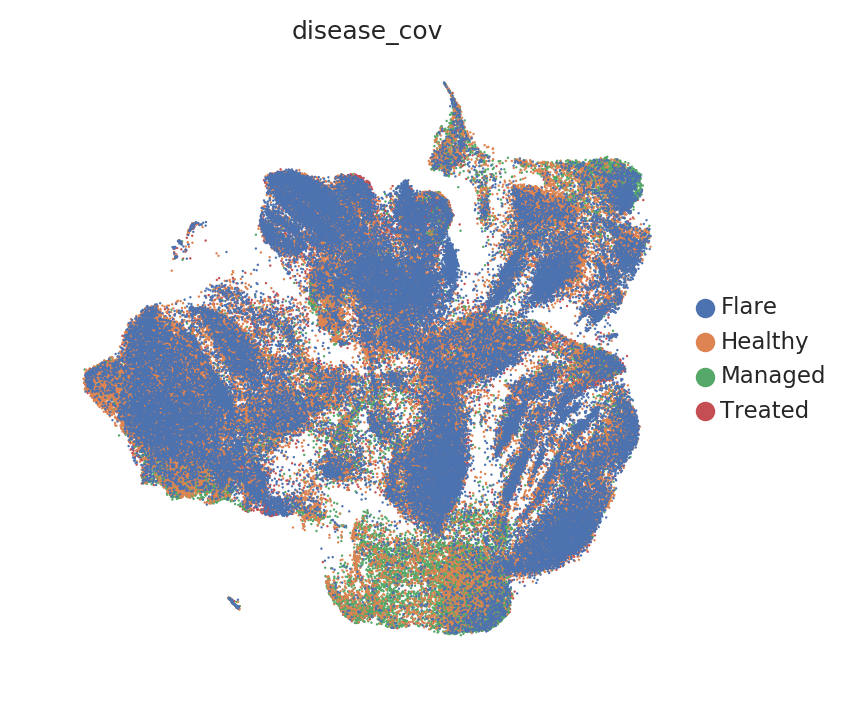

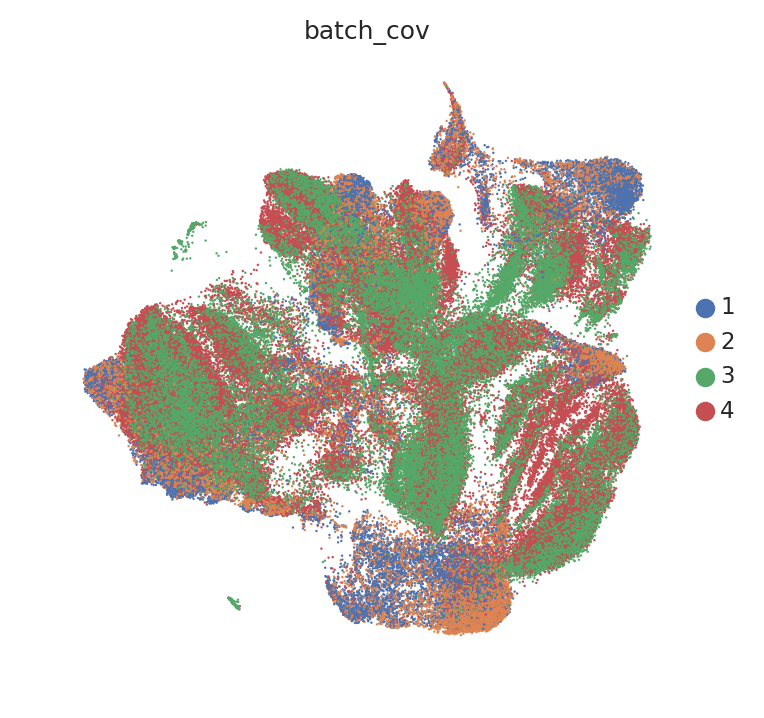

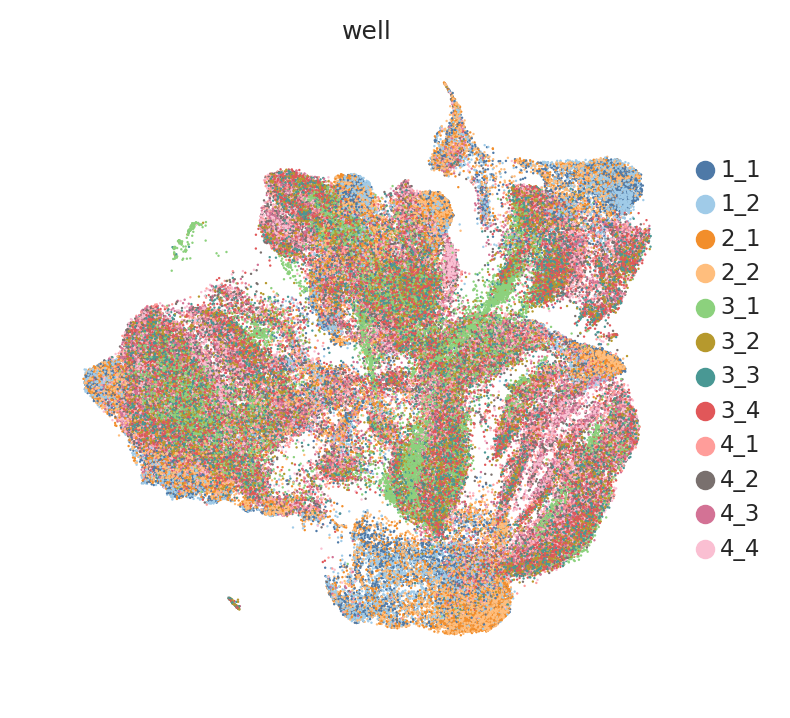

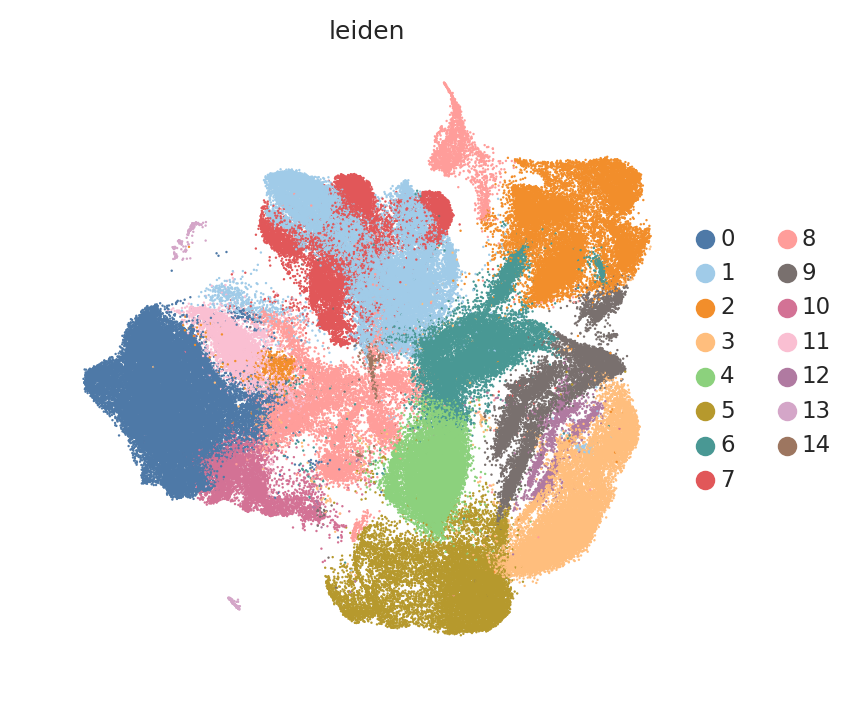

saving figure to file ./figures./umap.ab_ct_cov_figure6e.png


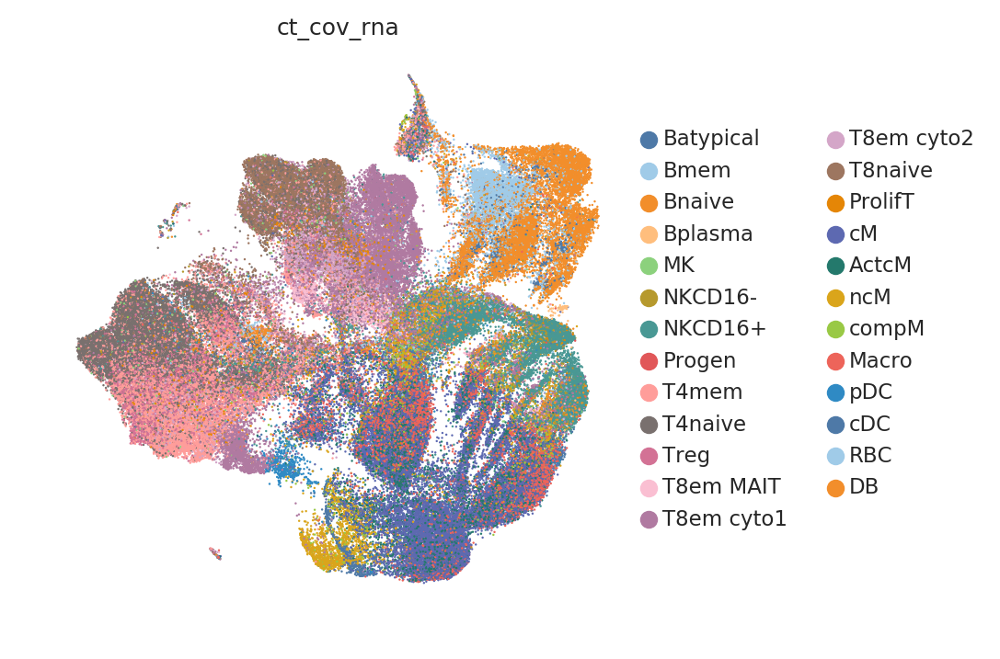

saving figure to file ./figures./umap.ab_ct_cov_11_figure6e.png


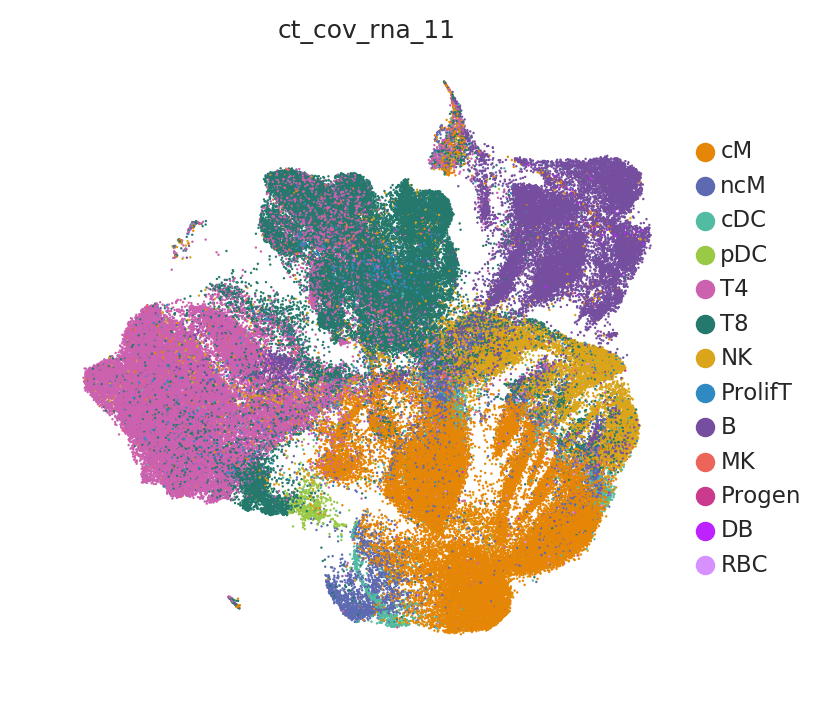

In [56]:
sc.pl.umap(pdatapseudo, color='disease_cov', show=True, size=3, edgecolor="none")
sc.pl.umap(pdatapseudo, color='batch_cov', show=True, size=3, edgecolor="none")
sc.pl.umap(pdatapseudo, color='well', show=True, size=3, edgecolor="none", palette=colorrs)
sc.pl.umap(pdatapseudo, color='leiden', show=True, size=3, edgecolor="none", palette=colorrs)
sc.pl.umap(pdatapseudo, color='ct_cov_rna', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_figure6e.png")

MasterORDER = ['cM', 'ncM', 'cDC', 'pDC', 'T4', 'T8', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB', 'RBC']
colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
pdatapseudo.obs['ct_cov_rna_11'] = pdatapseudo.obs['ct_cov_rna_11'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_rna_11_colors'] = colorrs
sc.pl.umap(pdatapseudo, color='ct_cov_rna_11', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_11_figure6e.png")


# Most abundant antibodies in antibody clustered communities

In [57]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(pdatapseudo.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = pdatapseudo.var_names[np.flipud(np.argsort(np.mean(pdatapseudo.X[pdatapseudo.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.head(5)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14
0,CD4|CD4|j95-14|pAbO,CD8|CD8A|j95-25|pAbO,CD19|CD19|j95-10|pAbO,HLA-DR|CD74|j95-18|pAbO,CD14|CD14|j95-20|pAbO,CD14|CD14|j95-20|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD8|CD8A|j95-25|pAbO,CD127|IL7R|j95-27|pAbO,CD183|CXCR3|j95-12|pAbO,CD4|CD4|j95-14|pAbO,CD183|CXCR3|j95-12|pAbO,CD38|CD38|j95-01|pAbO,CD183|CXCR3|j95-12|pAbO,CD38|CD38|j95-01|pAbO
1,CD27|CD27|j95-08|pAbO,CD27|CD27|j95-08|pAbO,CD185|CXCR5|j95-22|pAbO,CD38|CD38|j95-01|pAbO,CD38|CD38|j95-01|pAbO,CD38|CD38|j95-01|pAbO,CD161|KLRB1|j95-11|pAbO,CD183|CXCR3|j95-12|pAbO,CD197|CCR7|j95-09|pAbO,CD38|CD38|j95-01|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD4|CD4|j95-14|pAbO,HLA-DR|CD74|j95-18|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD161|KLRB1|j95-11|pAbO
2,CD28|CD28|j95-07|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD196|CCR6|j95-17|pAbO,CD14|CD14|j95-20|pAbO,CD45RO|PTPRC|j95-19|pAbO,HLA-DR|CD74|j95-18|pAbO,CD196|CCR6|j95-17|pAbO,CD27|CD27|j95-08|pAbO,CD194|CCR4|j95-21|pAbO,CD95|FAS|j95-02|pAbO,CD3|CD3E|j95-16|pAbO,CD27|CD27|j95-08|pAbO,CD95|FAS|j95-02|pAbO,HLA-DR|CD74|j95-18|pAbO,CD14|CD14|j95-20|pAbO
3,CD3|CD3E|j95-16|pAbO,CD127|IL7R|j95-27|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD161|KLRB1|j95-11|pAbO,CD194|CCR4|j95-21|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD197|CCR7|j95-09|pAbO,CD45RA|PTPRC|j95-28|pAbO,CD45RO|PTPRC|j95-19|pAbO,CD161|KLRB1|j95-11|pAbO,CD28|CD28|j95-07|pAbO,CD28|CD28|j95-07|pAbO,CD161|KLRB1|j95-11|pAbO,CD3|CD3E|j95-16|pAbO,CD194|CCR4|j95-21|pAbO
4,CD127|IL7R|j95-27|pAbO,CD3|CD3E|j95-16|pAbO,CD38|CD38|j95-01|pAbO,CD194|CCR4|j95-21|pAbO,CD95|FAS|j95-02|pAbO,CD4|CD4|j95-14|pAbO,CD194|CCR4|j95-21|pAbO,CD95|FAS|j95-02|pAbO,CD28|CD28|j95-07|pAbO,CD14|CD14|j95-20|pAbO,CD183|CXCR3|j95-12|pAbO,CD3|CD3E|j95-16|pAbO,CD197|CCR7|j95-09|pAbO,CD4|CD4|j95-14|pAbO,CD185|CXCR5|j95-22|pAbO


# Add antibody leiden and umap coordinates to pdata structure

In [58]:
pdata.obs['leiden'] = pdatapseudo.obs['leiden']
pdata.obsm['X_umap'] = pdatapseudo.obsm['X_umap']

# Annotate antibody clustered communities

In [59]:
pdata.obs['ct_cov_ab'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "0"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "1"] = "T8" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "2"] = "B" ## good                                                                                     
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "3"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "4"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "5"] = "Myeloid" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "6"] = "NK" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "7"] = "T8" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "8"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "9"] = "NK" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "10"] = "T4" ## good                                                                                  
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "11"] = "T4" ## good                                                                                    
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "12"] = "NK" ## good   
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "13"] = "T4" ## good   
pdata.obs['ct_cov_ab'].loc[pdata.obs.leiden == "14"] = "Myeloid" ## good   

pdata.obs['ct_cov_ab'] = pdata.obs['ct_cov_ab'].astype('category')


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


# Most expressed genes in antibody clustered communities

In [60]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(pdata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = pdata.var_names[np.flipud(np.argsort(np.mean(pdata.X[pdata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.head(10)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14
0,IL7R,CD8B,MS4A1,TYROBP,MNDA,CSTA,FCGR3A,CD8B,IL7R,KLRF1,IL32,IL7R,TYROBP,FCER1A,TYROBP
1,MAL,CD8A,CD79A,FCER1G,FCN1,CST3,KLRF1,CD8A,IL32,TYROBP,LILRA4,TRAT1,FCER1G,DDX3Y,FCER1G
2,TRAT1,RP11-291B21.2,CD79B,MNDA,CSTA,FCN1,GNLY,RP11-291B21.2,CD3G,GNLY,ITGB1,MAL,IGFBP7,VIM,FCGR3A
3,TSHZ2,CCL5,BANK1,CSTA,CST3,MNDA,GZMB,IL32,TRAT1,GZMB,SERPINF1,TSHZ2,TYMP,IFI30,GZMB
4,PRKCQ-AS1,IL32,VPREB3,CST3,VCAN,TYROBP,NKG7,CCL5,MAL,FCER1G,CD2,PRKCQ-AS1,CST3,HES4,CST3
5,LEF1,CD3G,LINC00926,VCAN,S100A12,LST1,PRF1,CD3G,CD2,PRF1,C12orf75,LEF1,CSTA,MT2A,GNLY
6,CD27,GZMK,RALGPS2,FCN1,AIF1,AIF1,KLRD1,AC092580.4,BCL11B,SPON2,TPM2,CD27,GNLY,CLEC10A,SERPINA1
7,FHIT,NKG7,TCL1A,S100A12,CTSS,CTSS,HOPX,GZMM,ITM2A,IGFBP7,GZMH,CD3G,NEAT1,CTA-445C9.15,RHOC
8,CD40LG,GZMH,HLA-DRA,CTSS,MS4A6A,FCER1G,CST7,GZMK,CD69,CLIC3,CD40LG,FHIT,KLRC1,CD68,PSAP
9,CCR7,GZMM,HLA-DQA1,LST1,TYROBP,TYMP,CTSW,NKG7,PRKCQ-AS1,CTSW,ITM2C,CCR7,S100A12,TNFSF10,NKG7


... storing 'batch_cov' as categorical


saving figure to file ./figures./umap.ab_ct_cov_figure6e.png


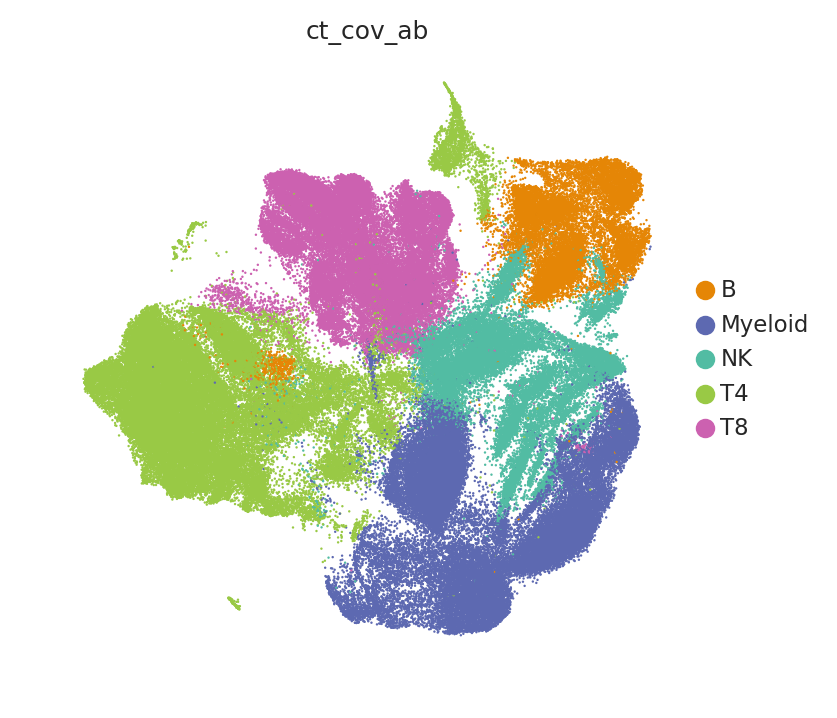

In [61]:

sc.pl.umap(pdata, color='ct_cov_ab', show=True, size=3, edgecolor="none", palette=colorrs, save=".ab_ct_cov_figure6e.png")


# T Cyto 1 pop feature plots

In [62]:
sc.pl.umap(pdata, color=['CD8A', 'CD4', 'GZMB', 'SERPINF1', 'DNASE1L3'], show=False, size=3, edgecolor="none", palette=colorrs, save=".figure6e_ab_umap_cyto1featureplots.png")


saving figure to file ./figures./umap.figure6e_ab_umap_cyto1featureplots.png


# Statistics

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


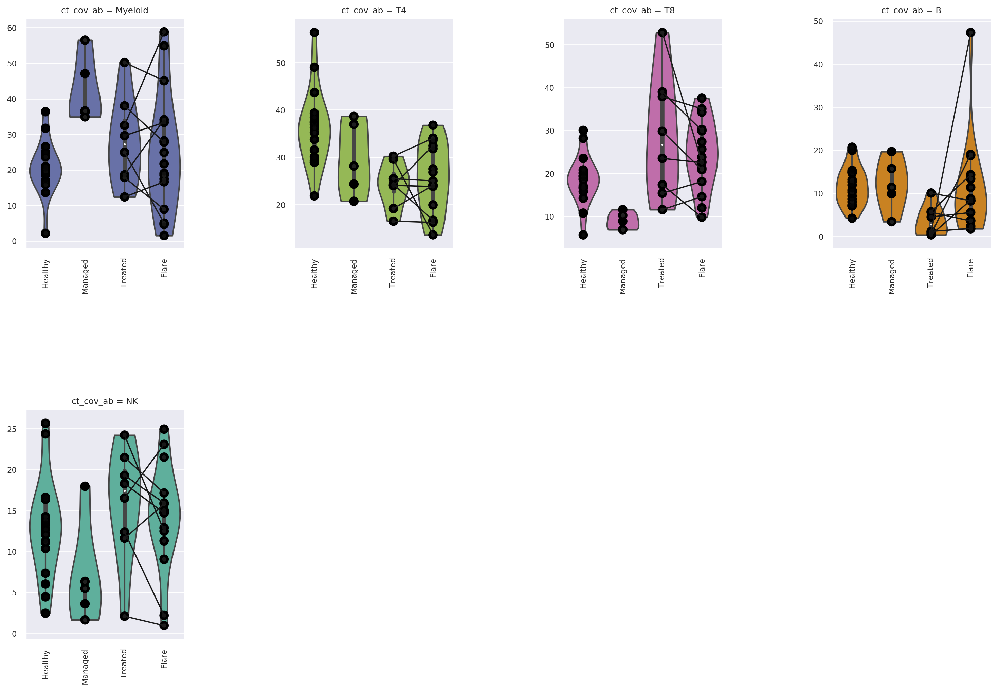

In [63]:
## Make proportion plots
pdata_obs_small = pdata.obs
ind_count = pdata_obs_small.groupby(['ind_cov_disease_cov','ct_cov_ab','disease_cov','pop_cov', 'ind_cov'])['ct_cov_ab'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {  'ct_cov_ab':['T8cytol.a', 'T8cytol.b', 'pDC', 'iM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progrenitor',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1','T4IFN', 'T8em cyto2', 'T8em cyto3', 'T8naive', 'Treg',  'NK',    'TProlif', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['lymph',   'lymph', 'mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph',     'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
pdata.obs['ct_group'] = pdata.obs['ct_cov_ab'].tolist()
celltypes = np.unique(cg_cov['ct_cov_ab'].tolist())

for ii in range(len(celltypes)):
    pdata.obs['ct_group'][pdata.obs['ct_cov_ab']==cg_cov['ct_cov_ab'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov_ab').join(cg_cov.set_index('ct_cov_ab'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov_ab = ind_perc.ct_cov_ab.astype('category')
ind_perc.ct_cov_ab = ind_perc.ct_cov_ab.cat.reorder_categories(pdata.obs.ct_cov_ab.cat.categories.values)


ORDER = ['Myeloid', 'T4', 'T8','B', 'NK']
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov_ab', data=ind_perc, kind='violin', col_order=ORDER,order=[ "Healthy", "Managed", "Treated", "Flare"], col='ct_cov_ab', col_wrap=4, cut=0, dodge=False, aspect=0.75, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov_ab == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov_ab == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.7, hspace = 0.7)
    
perc_plot.savefig(figdir+"/violin.ct_cov_ab_figure6e.png")


# Analysis of two T8em cyto 1 populations

... storing 'ct_group' as categorical


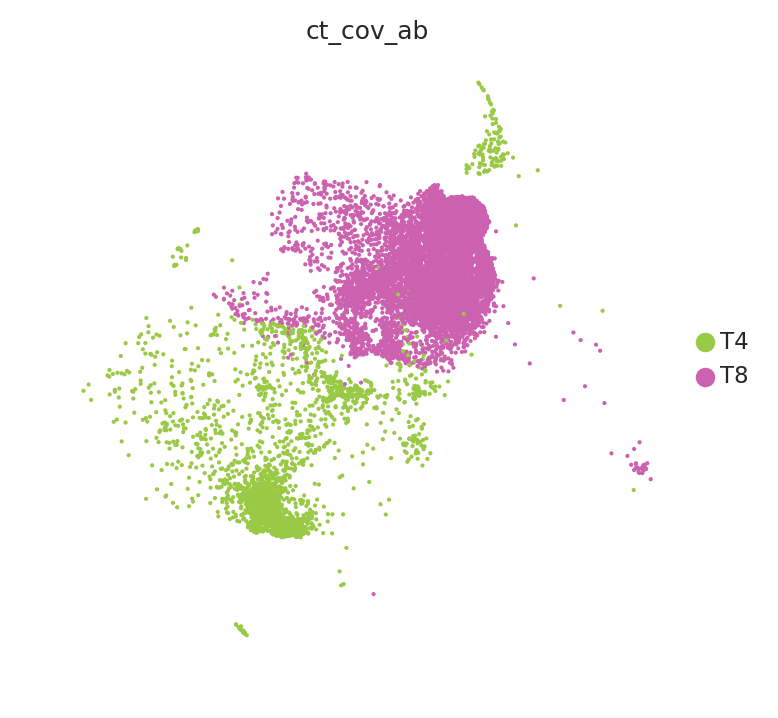

ranking genes


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


    finished (0:00:00.69)
saving figure to file ./figures./umap.ruleoutDoublePositive_protein_projection.png


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


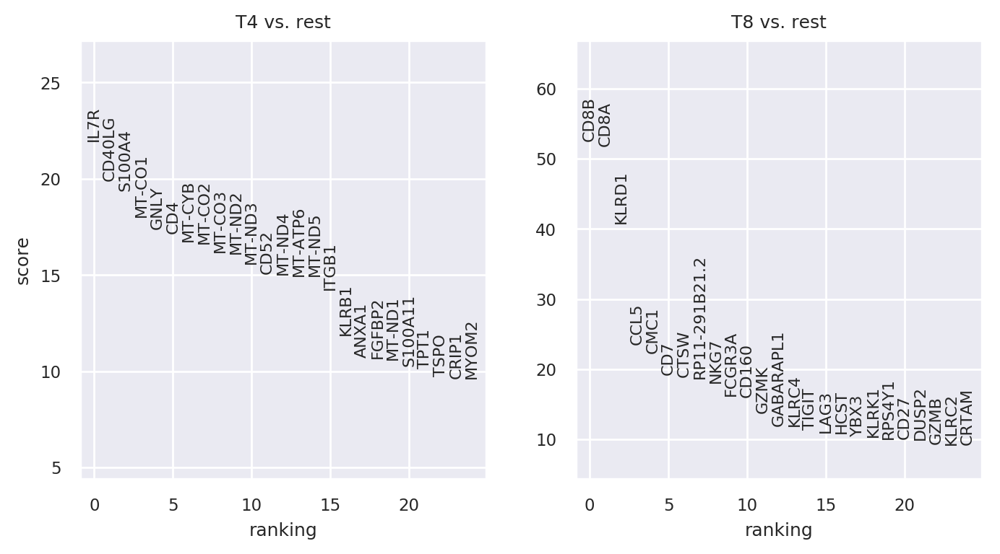

In [64]:
T8emctyo1 = pdata[(pdata.obs['ct_cov_ab'].isin(['T4','T8'])) & (pdata.obs['ct_cov_Flr']=='T8em cyto1_Flare')]
sc.pl.umap(T8emctyo1, color='ct_cov_ab', show=True)
sc.tl.rank_genes_groups(T8emctyo1, 'ct_cov_ab', method='t-test')
sc.pl.rank_genes_groups(T8emctyo1, n_genes=25, sharey=False)
CD4cyto1list = T8emctyo1[T8emctyo1.obs['ct_cov_ab']=='T4'].obs_names.tolist()
sc.pl.umap(T8emctyo1, color=['CD4', 'CD8A'], save='.ruleoutDoublePositive_protein_projection.png')
# Modify mRNA annotation with new information from protein analysis
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype("str")
adata.obs['ct_cov'][adata.obs_names.isin(CD4cyto1list)] = 'T4em cyto1'
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

saving figure to file ./figures./umap.figure6fa.png


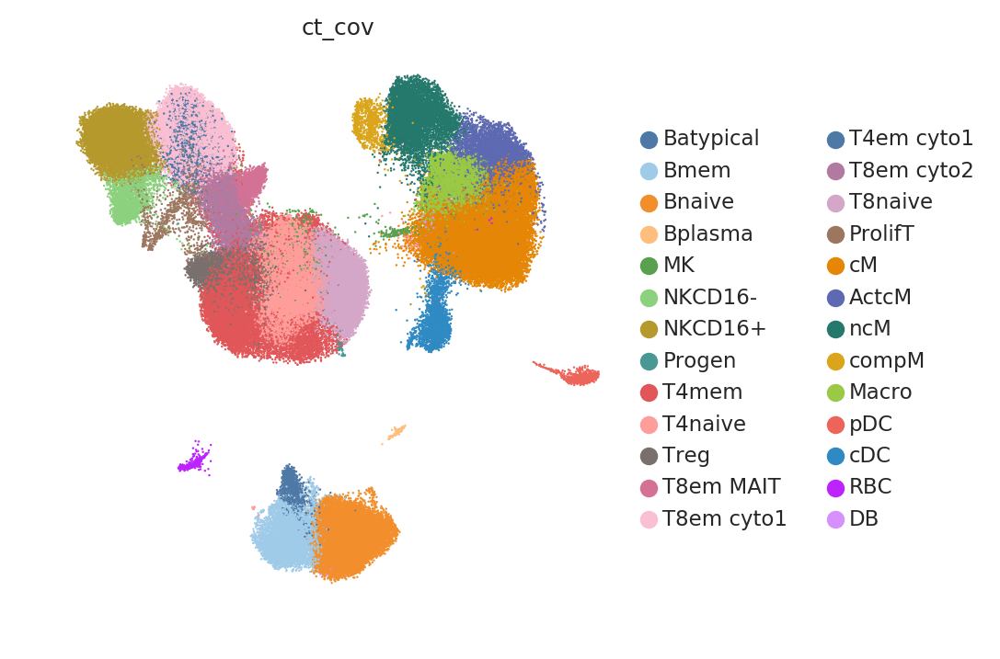

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,0.09708574749457986,Batypical,0.135265
1,2.967883150468201,Bmem,0.009567
2,-2.5783457759301247,Bnaive,0.214172
3,-0.03213265827977511,Bplasma,0.451432
4,0.6146578448617228,MK,0.011250
5,0.42128493363008945,NKCD16-,0.100307
6,-0.9334344436374948,NKCD16+,0.556781
7,0.029349768533405277,Progen,0.117739
8,0.6405931979064743,T4mem,0.738855
9,15.233930383788234,T4naive,0.000131


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.15072299655065804,Batypical,0.100689
1,3.752089588089703,Bmem,0.002435
2,2.3775816570676493,Bnaive,0.231799
3,-0.12845370574575055,Bplasma,0.081659
4,0.45948492530960466,MK,0.051472
5,0.06835802378863504,NKCD16-,0.837616
6,-5.584523088834793,NKCD16+,0.019674
7,-0.1003890692164899,Progen,0.007734
8,3.7116582408944008,T4mem,0.032991
9,13.374673787692815,T4naive,0.000301


as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-1.2987628777102465,Batypical,0.029221
1,2.147079410237305,Bmem,0.009656
2,-1.7948228474544234,Bnaive,0.447997
3,-0.0887545246093075,Bplasma,0.057764
4,0.5042368410789463,MK,0.002026
5,0.37818397591311276,NKCD16-,0.112860
6,-0.07065821802664018,NKCD16+,0.955879
7,0.015301118086850982,Progen,0.240947
8,2.6960094749568437,T4mem,0.014563
9,10.17533021743548,T4naive,0.000085


as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-1.1480398811595882,Batypical,0.281180
1,-1.6050101778523986,Bmem,0.060371
2,-4.172404504522076,Bnaive,0.355520
3,0.03969918113644312,Bplasma,0.760329
4,0.04475191576934177,MK,0.772060
5,0.3098259521244776,NKCD16-,0.446095
6,5.5138648708081455,NKCD16+,0.053735
7,0.11569018730334081,Progen,0.000966
8,-1.0156487659375553,T4mem,0.504850
9,-3.1993435702573265,T4naive,0.122083


as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,0.2478087440452377,Batypical,0.049971
1,-0.7842064376215045,Bmem,0.086807
2,-4.955927432997777,Bnaive,0.163080
3,0.09632104746597542,Bplasma,0.575155
4,0.15517291955211826,MK,0.431842
5,0.3529269098414545,NKCD16-,0.457227
6,4.6510886451972935,NKCD16+,0.263507
7,0.1297388377498952,Progen,0.027348
8,-3.0710650429879243,T4mem,0.315696
9,1.859256596095419,T4naive,0.299912


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.7279383909381446,Batypical,1.191075e-01
1,2.669162239714906,Bmem,7.233211e-05
2,-1.3354991468150175,Bnaive,5.007456e-01
3,-0.08499107857978719,Bplasma,5.937759e-02
4,0.5215596418032666,MK,9.711804e-05
5,0.3208049431903322,NKCD16-,1.358897e-01
6,-1.4681920251454859,NKCD16+,3.306054e-01
7,0.011318238070426551,Progen,4.483940e-01
8,2.4128674412595803,T4mem,3.656646e-02
9,12.098929647054781,T4naive,2.535840e-08


as a proportion of total PBMC: Flare vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-1.3958486252048259,Batypical,0.162549
1,-0.8208037402308939,Bmem,0.291531
2,0.7835229284757007,Bnaive,0.842471
3,-0.05662186632953227,Bplasma,0.593581
4,-0.11042100378277625,MK,0.452401
5,-0.04310095771697721,NKCD16-,0.896344
6,0.8627762256108569,NKCD16+,0.695042
7,-0.01404865044655432,Progen,0.362605
8,2.055416277050371,T4mem,0.266859
9,-5.058600166352745,T4naive,0.025408


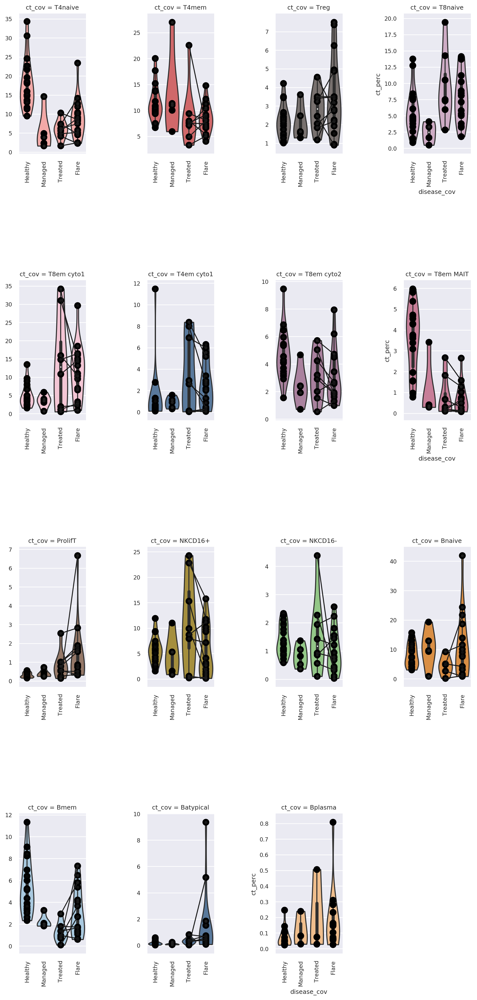

In [65]:
MasterORDER = ['Batypical', 'Bmem', 'Bnaive', 'Bplasma', 'MK', 'NKCD16-', 'NKCD16+', 'Progen', 'T4mem', 'T4naive', 'Treg', 'T8em MAIT', 'T8em cyto1', 'T4em cyto1', 'T8em cyto2', 'T8naive', 'ProlifT', 'cM', 'ActcM', 'ncM', 'compM', 'Macro', 'pDC', 'cDC', 'RBC', 'DB']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#59A14F","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2",'#4E79A7',
           "#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#99C945', '#ED645A', '#2F8AC4', '#BC23FF', '#D790FF']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=3, show=True, edgecolor="none", save='.figure6fa.png', palette=colorrs)

## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]


# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()
## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['ActcM','pDC', 'infM',   'compM', 'NKCD16-', 'NKCD16+', 'Batypical', 'DB',      'Progen',  'Th',    'Bplasma', 'Bmem',  'Bnaive', 'cM',   'ncM',  'iM',  'T4naive', 'Macro', 'T4mem', 'T8mem', 'T8em cyto1', 'T4em cyto1','T4IFN', 'T8em cyto2', 'T8em MAIT', 'T8naive', 'Treg',  'NK',    'ProlifT', 'Tc1q+', 'cDC', 'RBC'], 
                          'ct_group':['mono','mono', 'mono', 'mono',  'lymph',   'lymph',   'lymph',     'Doublet', 'Progrenitor',  'lymph', 'lymph',   'lymph', 'lymph',  'mono', 'mono', 'mono','lymph',   'mono',  'lymph', 'lymph', 'lymph', 'lymph',    'lymph', 'lymph',      'lymph',      'lymph',   'lymph', 'lymph', 'lymph',   'lymph', 'mono','RBC']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Managed'])]
HEALTHYMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated'])]
HEALTHYTREATED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Treated"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYTREATED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)


# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Flare'])]
HEALTHYFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Flare'])]
TREATEDFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Managed'])]
TREATEDMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Flare', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Flare vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Flare', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Managed"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)


ORDER = ['T4naive', 'T4mem', 'Treg', 'T8naive', 'T8em cyto1', 'T4em cyto1', 'T8em cyto2', 'T8em MAIT', 'ProlifT', 'NKCD16+', 'NKCD16-', 'Bnaive', 'Bmem', 'Batypical', 'Bplasma',
        ]

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col_order=ORDER, col='ct_cov', order=[ "Healthy", "Managed", "Treated", "Flare"], col_wrap=4, cut=0, dodge=False, aspect=0.5, sharex=False, sharey=False, palette=colorrs)
for ct_i in list(range(len(ORDER))):
    ct = ORDER[ct_i]    
    sns.stripplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], size=10, ax=perc_plot.axes[ct_i], jitter=False)
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], color="0",order=[ "Healthy", "Managed", "Treated", "Flare"], scale=0.5, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=0.9, hspace = 0.9)
    
perc_plot.savefig(figdir+"/violin.figure6fb.png")


In [66]:
ct = 'T8em cyto1'
print('Healthy')
display(ind_perc[ind_perc.disease_cov=='Healthy'][ind_perc.ct_cov==ct].ct_perc.mean())
print('Flare')
display(ind_perc[ind_perc.disease_cov=='Flare'][ind_perc.ct_cov==ct].ct_perc.mean())
print(ind_perc[ind_perc.disease_cov=='Healthy'][ind_perc.ct_cov==ct].ct_perc.mean() - ind_perc[ind_perc.disease_cov=='Flare'][ind_perc.ct_cov==ct].ct_perc.mean())



Healthy


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


4.988908985946302

Flare


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


11.262608815780858

-6.273699829834556


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


# Protein abundance for antibody clustering

In [67]:
pdata_obs_small = pdata.obs;
keys = pdata_obs_small.keys().tolist()
antibodykeys = [key for key in keys if 'pAbO' in key]
print('Ab keys')
print(antibodykeys)

for key in antibodykeys:
    sc.pl.umap(pdatapseudo, color=key,size=2, show=False, vmin=1, vmax=2, save=str(key + '.antibody_abclustering.png'))
    
    

Ab keys
['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']
saving figure to file ./figures./umapCD38|CD38|j95-01|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD95|FAS|j95-02|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD28|CD28|j95-07|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD27|CD27|j95-08|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD197|CCR7|j95-09|pAbO.antibody_abclustering.png
saving figure to file ./figures./umapCD19|CD19|j95-1

# Feature plot antibody expression on mRNA UMAP

In [68]:
pdatapseudo.obsm['X_umap'] = adata.obsm['X_umap']
pdata_obs_small = pdata.obs;
keys = pdata_obs_small.keys().tolist()
antibodykeys = [key for key in keys if 'pAbO' in key]
print('Ab keys')
print(antibodykeys)
for key in antibodykeys:
    sc.pl.umap(pdatapseudo, color=key,size=2, show=False, vmin=1, vmax=2, save=str(key + '.antibody.png'))
    

Ab keys
['CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO']
saving figure to file ./figures./umapCD38|CD38|j95-01|pAbO.antibody.png
saving figure to file ./figures./umapCD95|FAS|j95-02|pAbO.antibody.png
saving figure to file ./figures./umapCD28|CD28|j95-07|pAbO.antibody.png
saving figure to file ./figures./umapCD27|CD27|j95-08|pAbO.antibody.png
saving figure to file ./figures./umapCD197|CCR7|j95-09|pAbO.antibody.png
saving figure to file ./figures./umapCD19|CD19|j95-10|pAbO.antibody.png
saving figure to file ./figures./umapCD161|KL

# Correlations between mRNA and Protein

### |Warning heavy computation|

In [69]:
'''
obs = pd.DataFrame()
obs['disease_cov'] = pdata.obs['disease_cov']
pdata.obs['batch_cov'] = pdata.obs['batch_cov'].astype('str')
obs['batch_cov'] = pdata.obs['batch_cov']
obs['well'] = pdata.obs['well']
obs['Female'] = pdata.obs['Female']
obs['ct_cov_rna'] = pdata.obs['ct_cov']
obs['ind_cov'] = pdata.obs['ind_cov']
obs['ct_cov_rna_11'] = pdata.obs['ct_cov_11']
var = pd.DataFrame(index=pdata.raw.var_names.tolist())
pdata2 = ad.AnnData(pdata.raw.X, obs=obs, var=var, dtype='float64')
pdata2.obs['n_counts'] = np.ravel(pdata2.X.sum(axis=1))
print('Normalizing total counts to 10,000')
sc.pp.normalize_per_cell(pdata2, counts_per_cell_after=1e4)
print('Log transforming data')
sc.pp.log1p(pdata2)
print('Making .obs into categories')
pdata2.strings_to_categoricals()
sc.pp.scale(pdata2, max_value=10)
sc.pp.highly_variable_genes(pdata2, n_top_genes=6000)
print(pdata2)
## compute PCA
#sc.pp.pca(pdata2, random_state=1, svd_solver='arpack')
regressors = ['n_counts', 'Female'] # Add batch_cov?
print('Regressing out total nUMIs, and gender')
print('regressors: '+str(regressors))
sc.pp.regress_out(pdata2, regressors)
print('Scaling expression data')
sc.pp.scale(pdata2, max_value=10)
## combat adjustment                                                                                                                                                                                                           
print('Running combat')
mod = patsy.dmatrix("~ disease_cov", pdata2.obs, return_type="dataframe")
mod = mod.reset_index(drop=True)
batch = pdata2.obs['well']
batch = batch.reset_index(drop=True)
pdata2.X = combat.combat(pdata2.X.transpose(), batch=batch, model=mod).transpose();

pdata2.write('genes_adjusted.h5ad')
'''


'\nobs = pd.DataFrame()\nobs[\'disease_cov\'] = pdata.obs[\'disease_cov\']\npdata.obs[\'batch_cov\'] = pdata.obs[\'batch_cov\'].astype(\'str\')\nobs[\'batch_cov\'] = pdata.obs[\'batch_cov\']\nobs[\'well\'] = pdata.obs[\'well\']\nobs[\'Female\'] = pdata.obs[\'Female\']\nobs[\'ct_cov_rna\'] = pdata.obs[\'ct_cov\']\nobs[\'ind_cov\'] = pdata.obs[\'ind_cov\']\nobs[\'ct_cov_rna_11\'] = pdata.obs[\'ct_cov_11\']\nvar = pd.DataFrame(index=pdata.raw.var_names.tolist())\npdata2 = ad.AnnData(pdata.raw.X, obs=obs, var=var, dtype=\'float64\')\npdata2.obs[\'n_counts\'] = np.ravel(pdata2.X.sum(axis=1))\nprint(\'Normalizing total counts to 10,000\')\nsc.pp.normalize_per_cell(pdata2, counts_per_cell_after=1e4)\nprint(\'Log transforming data\')\nsc.pp.log1p(pdata2)\nprint(\'Making .obs into categories\')\npdata2.strings_to_categoricals()\nsc.pp.scale(pdata2, max_value=10)\nsc.pp.highly_variable_genes(pdata2, n_top_genes=6000)\nprint(pdata2)\n## compute PCA\n#sc.pp.pca(pdata2, random_state=1, svd_solver=\

In [70]:
pdata2 = sc.read('genes_adjusted.h5ad', cache=True)
pdatapseudo2 = pdatapseudo[pdatapseudo.obs['batch_cov'].isin(['3', '4'])]
pdata3 = pdata2[pdata2.obs['batch_cov'].isin(['3', '4'])]

abneo = []
for ab in ab_names:
    abneo.append(ab.split('|')[1])
uniqueinds = np.unique(pdatapseudo2.obs['ind_cov'].tolist())
print('Number of individuals: ' + str(uniqueinds))
for ii in range(len(ab_names)):
    print(abneo[ii])
    pdataseudo2means = []
    pdata2means = []
    for cc in range(len(uniqueinds)):
        try:
            pdata2means.append(np.mean(np.ravel(pdata3.X[:, pdata3.var_names==abneo[ii]][pdata3.obs['ind_cov']==uniqueinds[cc]].tolist())))
            pdataseudo2means.append(np.mean(np.ravel(pdatapseudo2.X[:, pdatapseudo2.var_names==ab_names[ii]][pdatapseudo2.obs['ind_cov']==uniqueinds[cc]].tolist())))
        except:
            continue
    #ax = sns.scatterplot(x=np.ravel(pdatapseudo.X[:, pdatapseudo.var_names==ab_names[ii]].tolist()), y=np.ravel(csr_matrix(pdata.raw.X[:, pdata.raw.var_names==abneo[ii]]).todense()))
    ax = sns.regplot(x=pdata2means, y=pdataseudo2means)
    #line = np.linspace(-2, 2, 10)
    #ax = plt.plot(line, line, color='k')
    ax = plt.axis('equal')
    ax = plt.title(abneo[ii])
    ax = plt.xlabel('mRNA (normalized)')
    ax = plt.ylabel('antibody abundance (normalized)')
    ax = plt.savefig('figures./' + abneo[ii] + '_proteinmRNA_correlation.png')
    ax = plt.close()
    print(stats.pearsonr(pdata2means, pdataseudo2means))
    

Number of individuals: ['1240' 'FLARE004' 'FLARE005' 'FLARE006' 'FLARE007' 'FLARE009' 'FLARE011'
 'FLARE013' 'FLARE014' 'FLARE015' 'FLARE016' 'FLARE017' 'FLARE018'
 'FLARE019' 'FLARE020' 'HC-002' 'HC-014' 'HC-020' 'HC-501' 'HC-502'
 'HC-503' 'HC-504' 'HC-506' 'IGTB1372' 'IGTB1506' 'IGTB195' 'IGTB469'
 'IGTB508' 'IGTB826']
CD38
(0.2289144635451408, 0.23229886153628473)
FAS
(-0.02598233548055077, 0.8935711601398643)
CD28
(-0.022614217568930207, 0.9073045504845356)
CD27


ValueError: all the input array dimensions except for the concatenation axis must match exactly